In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d import Axes3D
import itertools
import math

ROOM_SIZE = 5  #Odd
DEGREE = 3
EPISODES = 10000
STEP_SIZE_0 = 1*(10**-2)
STEP_SIZE_1 = 5*(10**-4)
DISCOUNT = .9
SHOW_EPISODE = 50
SIZE = ROOM_SIZE*2+1
NUM_TEST = 30


def main():
    epsilon = 1
    step_size = STEP_SIZE_0
    weights = np.full((DEGREE+1,)*6, 0.0)
    store_avg = []

    for current in range(EPISODES):
        goal = (np.random.randint(ROOM_SIZE+1,SIZE),np.random.randint(ROOM_SIZE+1,SIZE))
        td_record = {}
        for row,col in np.ndindex(2*ROOM_SIZE,2*ROOM_SIZE):
            pos = (row+1 if row>=ROOM_SIZE else row,col+1 if row>=ROOM_SIZE else col)
            dist = np.subtract(goal,pos)

            a = pick_action(pos,goal,epsilon,weights)
            action = (round(math.cos(a)),round(math.sin(a)))
            new_pos = find_new(action,pos)
            new_dist = np.subtract(goal,new_pos)

            features = calc_features(pos,goal,dist)
            next_features = calc_features(new_pos,goal,new_dist)
            reward = find_reward(pos,new_pos,goal)

            old_value = np.sum(np.multiply(weights,features))
            new_value = np.sum(np.multiply(weights,next_features))

            td_error = step_size*(reward+DISCOUNT*new_value-old_value)*features
            td_record[pos] = td_error

        for pos in td_record:
            weights = np.add(weights,td_record[pos])

        if((current+1)%SHOW_EPISODE==0):
            pos = (np.random.randint(0,ROOM_SIZE),np.random.randint(0,ROOM_SIZE))
            dist = np.subtract(goal,pos)
            count,average = 0,0

            for i in range(NUM_TEST):
                goal = (np.random.randint(ROOM_SIZE+1,SIZE),np.random.randint(ROOM_SIZE+1,SIZE))
                pos = (np.random.randint(0,ROOM_SIZE),np.random.randint(0,ROOM_SIZE))
                dist = np.subtract(goal,pos)
                while((dist[0]!=0)and(dist[1]!=0)):
                    a = pick_action(pos,goal,epsilon,weights)
                    action = (round(math.cos(a)),round(math.sin(a)))
                    new_pos = find_new(action,pos)
                    new_dist = np.subtract(goal,new_pos)
                    pos = new_pos
                    dist = new_dist
                    count += 1
                average = (average*i+count)/((i+1))
                count = 0
            store_avg.append(average)
            show_current(weights,goal,current,average,store_avg)
            average = 0

        epsilon = epsilon - epsilon/(EPISODES//2-1)
        step_size = STEP_SIZE_0/(1+((STEP_SIZE_0-STEP_SIZE_1)/(STEP_SIZE_1*EPISODES))*current)


def show_current(weights,goal,current,average,store_avg):
    print('Episode: '+str(current+1)+'\nAverage: '+str(average)+'\nGoal: '+str(goal),end='\n\n')
    x,y = np.meshgrid(np.arange(SIZE),np.arange(SIZE))
    z1 = np.array([[find_value((i, j), goal, np.subtract(goal, (i, j)), weights) for j in range(SIZE)] for i in range(SIZE)])
    fig = plt.figure(figsize=(18,3.5))
    gs = GridSpec(1, 3, width_ratios=[2,1,2])
    ax1 = fig.add_subplot(gs[0], projection="3d")
    ax1.plot_surface(x,y,z1)
    ax1.set(title='Value Function',xlabel='X',ylabel='Y')
    ax1.view_init(elev=30, azim=-60)
    ax2 = fig.add_subplot(gs[1])
    ax2.plot(SHOW_EPISODE*np.arange(len(store_avg)),np.array(store_avg),color='red')
    ax2.set(title='Policy Test',ylim=[0,1.2*max(store_avg)])
    #plt.xlim([0,EPISODES//SHOW_EPISODE])
    ax3 = fig.add_subplot(gs[2],projection='3d')
    z2 = np.array([[(find_value((i,j),goal,np.subtract(goal,(i,j)),weights)-optimal_value((i, j), goal))**2 for j in range(SIZE)] for i in range(SIZE)])
    ax3.set(title='Error Function',xlabel='X',ylabel='Y')
    ax3.view_init(elev=30, azim=-60)
    ax3.plot_surface(x,y,z2)

    plt.subplots_adjust(wspace=-.1)
    plt.show()
    print_policy(weights,goal)
    print('Mean Square Error = ' + str(np.sum(z2)/len(z2)) + '\n'+'_'*100)

def calc_features(pos,goal,dist):
    indices = np.indices((DEGREE+1,)*6)
    start_x, start_y, end_x, end_y, x_dist, y_dist = [indices[i].flatten() for i in range(6)]
    temp = (
        ((pos[0]/SIZE)**start_x)*((pos[1]/SIZE)**start_y)*
        ((goal[0]/SIZE)**end_x)*((goal[1]/SIZE)**end_y)*
        ((dist[0]/SIZE)**x_dist)*((dist[1]/SIZE)**y_dist)
    )
    temp = temp.reshape((DEGREE+1,)*6)
    return(temp)

def pick_action(pos,goal,epsilon,weights):
    if(np.random.random()<epsilon):
        return(np.random.choice([0,np.pi/2,np.pi,3*np.pi/2]))
    else:
        return((np.pi/2)*arg_max(pos,goal,weights))

def arg_max(pos,goal,weights):
    values = np.zeros(4)
    for i in range(4):
        new_pos = find_new((round(math.cos(np.pi/2*i)),round(math.sin(np.pi/2*i))),pos)
        if(new_pos[0]!=pos[0]or new_pos[1]!=pos[1]):
            values[i] = find_value(new_pos,goal,np.subtract(goal,new_pos),weights)
        else:
            values[i] = -math.inf
    return(np.argmax(values))

def find_value(pos,goal,dist,weights):
    flat_w = weights.flatten()
    indices = np.indices((DEGREE+1,)*6)
    start_x, start_y, end_x, end_y, x_dist, y_dist = [indices[i].flatten() for i in range(6)]
    values = flat_w*(
        ((pos[0]/SIZE)**start_x)*((pos[1]/SIZE)**start_y)*
        ((goal[0]/SIZE)**end_x)*((goal[1]/SIZE)**end_y)*
        ((dist[0]/SIZE)**x_dist)*((dist[1]/SIZE)**y_dist)
    )
    return values.sum()

def min_dist(pos,goal,index=-1):
    if(index==-1):
        return min(np.sum([abs(np.subtract(pos,goal)[i]) for i in [0,1]]),np.sum([abs(np.subtract(pos,(goal[1],goal[0]))[i]) for i in [0,1]]))
    return [np.sum([abs(np.subtract(pos,((ROOM_SIZE-1)/2,ROOM_SIZE-1))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-ROOM_SIZE,SIZE-1-(ROOM_SIZE-1)/2))[i]) for i in [0,1]]), \
            np.sum([abs(np.subtract(pos,(ROOM_SIZE-1,(ROOM_SIZE-1)/2))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))[i]) for i in [0,1]])][index]

def optimal_value(pos,goal,first=True):
    if(pos==goal):
        return find_reward(pos,pos,goal)
    if(not first):
        return find_reward((-1,-1),pos,goal) + DISCOUNT*optimal_value((pos[0]-1,pos[1]),goal,first=False)
    d = 0
    if(pos[0]<ROOM_SIZE and pos[1]<ROOM_SIZE):
        i = np.argmin([np.sum([abs(np.subtract(pos,((ROOM_SIZE-1)/2,ROOM_SIZE-1))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-ROOM_SIZE,SIZE-1-(ROOM_SIZE-1)/2))[i]) for i in [0,1]]), \
            np.sum([abs(np.subtract(pos,(ROOM_SIZE-1,(ROOM_SIZE-1)/2))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))[i]) for i in [0,1]])])
        d = min_dist(pos,goal,index=i) + ROOM_SIZE+3
    elif(pos[0]>ROOM_SIZE and pos[1]>ROOM_SIZE):
        d = np.sum([abs(np.subtract(pos,goal)[i]) for i in [0,1]])
    else:
        d = min_dist(pos,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE)) + min_dist(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))
    return (find_reward((d-1,0),(d,0),(0,0)) + DISCOUNT*optimal_value((d-1,0),(0,0),first=False))

def find_new(action,pos):
    new_pos = [min(SIZE-1,max(0,action[i]+pos[i])) for i in range(2)]
    for i in range(2):
        if(new_pos[0]==ROOM_SIZE and (new_pos[1-i]!=ROOM_SIZE//2 and new_pos[1-i]!=2*ROOM_SIZE-ROOM_SIZE//2)):
            new_pos[i] = pos[i]
    return tuple(new_pos)

def find_reward(pos,new_pos,goal):
    if(new_pos==goal):
        return 1
    elif(pos==new_pos):
        return(-SIZE/ROOM_SIZE)
    else:
        return(-np.sum([abs(np.subtract(new_pos,goal)[i]) for i in [0,1]])/ROOM_SIZE)

def print_policy(weights,goal):
    sym = {0: ">", 1: "V", 2: "<", 3: "^"}
    for y in range(SIZE):
        for x in range(SIZE):
            if((x,y)==goal):
                print('O',end=' ')
            elif((x==ROOM_SIZE and (y not in {ROOM_SIZE//2,2*ROOM_SIZE-ROOM_SIZE//2}))or \
                 (y==ROOM_SIZE and (x not in {ROOM_SIZE//2,2*ROOM_SIZE-ROOM_SIZE//2}))):
                print(' ',end=' ')
            else:
                print(sym[arg_max((x,y),goal,weights)],end=' ')
        print()
    print('\n')

main()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d import Axes3D
import itertools
import math

ROOM_SIZE = 7  #Odd
DEGREE = 3
EPISODES = 10000
STEP_SIZE_0 = 1*(10**-3)
STEP_SIZE_1 = 5*(10**-6)
DISCOUNT = .8
SHOW_EPISODE = 50
SIZE = ROOM_SIZE*2+1
NUM_TEST = 30


def main():
    epsilon = 1
    step_size = STEP_SIZE_0
    weights = np.full((DEGREE+1,)*6, 0.0)
    store_avg = []

    for current in range(EPISODES):
        goal = (np.random.randint(ROOM_SIZE+1,SIZE),np.random.randint(ROOM_SIZE+1,SIZE))
        td_record = {}
        for row,col in np.ndindex(2*ROOM_SIZE,2*ROOM_SIZE):
            pos = (row+1 if row>=ROOM_SIZE else row,col+1 if row>=ROOM_SIZE else col)
            dist = np.subtract(goal,pos)

            a = pick_action(pos,goal,epsilon,weights)
            action = (round(math.cos(a)),round(math.sin(a)))
            new_pos = find_new(action,pos)
            new_dist = np.subtract(goal,new_pos)

            features = calc_features(pos,goal,dist)
            next_features = calc_features(new_pos,goal,new_dist)
            reward = find_reward(pos,new_pos,goal)

            old_value = np.sum(np.multiply(weights,features))
            new_value = np.sum(np.multiply(weights,next_features))

            td_error = step_size*(reward+DISCOUNT*new_value-old_value)*features
            td_record[pos] = td_error

        for pos in td_record:
            weights = np.add(weights,td_record[pos])

        if((current+1)%SHOW_EPISODE==0):
            pos = (np.random.randint(0,ROOM_SIZE),np.random.randint(0,ROOM_SIZE))
            dist = np.subtract(goal,pos)
            count,average = 0,0

            for i in range(NUM_TEST):
                goal = (np.random.randint(ROOM_SIZE+1,SIZE),np.random.randint(ROOM_SIZE+1,SIZE))
                pos = (np.random.randint(0,ROOM_SIZE),np.random.randint(0,ROOM_SIZE))
                dist = np.subtract(goal,pos)
                while((dist[0]!=0)and(dist[1]!=0)):
                    a = pick_action(pos,goal,epsilon,weights)
                    action = (round(math.cos(a)),round(math.sin(a)))
                    new_pos = find_new(action,pos)
                    new_dist = np.subtract(goal,new_pos)
                    pos = new_pos
                    dist = new_dist
                    count += 1
                average = (average*i+count)/((i+1))
                count = 0
            store_avg.append(average)
            show_current(weights,goal,current,average,store_avg)
            average = 0

        epsilon = epsilon - epsilon/(EPISODES//2-1)
        step_size = STEP_SIZE_0/(1+((STEP_SIZE_0-STEP_SIZE_1)/(STEP_SIZE_1*EPISODES))*current)


def show_current(weights,goal,current,average,store_avg):
    print('Episode: '+str(current+1)+'\nAverage: '+str(average)+'\nGoal: '+str(goal),end='\n\n')
    x,y = np.meshgrid(np.arange(SIZE),np.arange(SIZE))
    z1 = np.array([[find_value((i, j), goal, np.subtract(goal, (i, j)), weights) for j in range(SIZE)] for i in range(SIZE)])
    fig = plt.figure(figsize=(18,3.5))
    gs = GridSpec(1, 3, width_ratios=[2,1,2])
    ax1 = fig.add_subplot(gs[0], projection="3d")
    ax1.plot_surface(x,y,z1)
    ax1.set(title='Value Function',xlabel='X',ylabel='Y')
    ax1.view_init(elev=30, azim=-60)
    ax2 = fig.add_subplot(gs[1])
    ax2.plot(SHOW_EPISODE*np.arange(len(store_avg)),np.array(store_avg),color='red')
    ax2.set(title='Policy Test',ylim=[0,1.2*max(store_avg)])
    #plt.xlim([0,EPISODES//SHOW_EPISODE])
    ax3 = fig.add_subplot(gs[2],projection='3d')
    z2 = np.array([[(find_value((i,j),goal,np.subtract(goal,(i,j)),weights)-optimal_value((i, j), goal))**2 for j in range(SIZE)] for i in range(SIZE)])
    #z2 = np.array([[optimal_value((i, j), goal) for j in range(SIZE)] for i in range(SIZE)])
    ax3.set(title='Error Function',xlabel='X',ylabel='Y')
    ax3.view_init(elev=30, azim=-60)
    ax3.plot_surface(x,y,z2)

    plt.subplots_adjust(wspace=-.1)
    plt.show()
    print_policy(weights,goal)
    print('Mean Square Error = ' + str(np.sum(z2)/len(z2)) + '\n'+'_'*100)

def calc_features(pos,goal,dist):
    indices = np.indices((DEGREE+1,)*6)
    start_x, start_y, end_x, end_y, x_dist, y_dist = [indices[i].flatten() for i in range(6)]
    temp = (
        ((pos[0]/SIZE)**start_x)*((pos[1]/SIZE)**start_y)*
        ((goal[0]/SIZE)**end_x)*((goal[1]/SIZE)**end_y)*
        ((dist[0]/SIZE)**x_dist)*((dist[1]/SIZE)**y_dist)
    )
    temp = temp.reshape((DEGREE+1,)*6)
    return(temp)

def pick_action(pos,goal,epsilon,weights):
    if(np.random.random()<epsilon):
        return(np.random.choice([0,np.pi/2,np.pi,3*np.pi/2]))
    else:
        return((np.pi/2)*arg_max(pos,goal,weights))

def arg_max(pos,goal,weights):
    values = np.zeros(4)
    for i in range(4):
        new_pos = find_new((round(math.cos(np.pi/2*i)),round(math.sin(np.pi/2*i))),pos)
        if(new_pos[0]!=pos[0]or new_pos[1]!=pos[1]):
            values[i] = find_value(new_pos,goal,np.subtract(goal,new_pos),weights)
        else:
            values[i] = -math.inf
    return(np.argmax(values))

def find_value(pos,goal,dist,weights):
    flat_w = weights.flatten()
    indices = np.indices((DEGREE+1,)*6)
    start_x, start_y, end_x, end_y, x_dist, y_dist = [indices[i].flatten() for i in range(6)]
    values = flat_w*(
        ((pos[0]/SIZE)**start_x)*((pos[1]/SIZE)**start_y)*
        ((goal[0]/SIZE)**end_x)*((goal[1]/SIZE)**end_y)*
        ((dist[0]/SIZE)**x_dist)*((dist[1]/SIZE)**y_dist)
    )
    return values.sum()

def min_dist(pos,goal,index=-1):
    if(index==-1):
        return min(np.sum([abs(np.subtract(pos,goal)[i]) for i in [0,1]]),np.sum([abs(np.subtract(pos,(goal[1],goal[0]))[i]) for i in [0,1]]))
    return [np.sum([abs(np.subtract(pos,((ROOM_SIZE-1)/2,ROOM_SIZE-1))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-ROOM_SIZE,SIZE-1-(ROOM_SIZE-1)/2))[i]) for i in [0,1]]), \
            np.sum([abs(np.subtract(pos,(ROOM_SIZE-1,(ROOM_SIZE-1)/2))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))[i]) for i in [0,1]])][index]

def optimal_value(pos,goal,first=True):
    if(pos==goal):
        return find_reward(pos,pos,goal)
    if(not first):
        return find_reward((-1,-1),pos,goal) + DISCOUNT*optimal_value((pos[0]-1,pos[1]),goal,first=False)
    d = 0
    if(pos[0]<ROOM_SIZE and pos[1]<ROOM_SIZE):
        i = np.argmin([np.sum([abs(np.subtract(pos,((ROOM_SIZE-1)/2,ROOM_SIZE-1))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-ROOM_SIZE,SIZE-1-(ROOM_SIZE-1)/2))[i]) for i in [0,1]]), \
            np.sum([abs(np.subtract(pos,(ROOM_SIZE-1,(ROOM_SIZE-1)/2))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))[i]) for i in [0,1]])])
        d = min_dist(pos,goal,index=i) + ROOM_SIZE+3
    elif(pos[0]>ROOM_SIZE and pos[1]>ROOM_SIZE):
        d = np.sum([abs(np.subtract(pos,goal)[i]) for i in [0,1]])
    else:
        d = min_dist(pos,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE)) + min_dist(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))
    return (find_reward((d-1,0),(d,0),(0,0)) + DISCOUNT*optimal_value((d-1,0),(0,0),first=False))

def find_new(action,pos):
    new_pos = [min(SIZE-1,max(0,action[i]+pos[i])) for i in range(2)]
    for i in range(2):
        if(new_pos[0]==ROOM_SIZE and (new_pos[1-i]!=ROOM_SIZE//2 and new_pos[1-i]!=2*ROOM_SIZE-ROOM_SIZE//2)):
            new_pos[i] = pos[i]
    return tuple(new_pos)

def find_reward(pos,new_pos,goal):
    if(new_pos==goal):
        return 1
    elif(pos==new_pos):
        return(-1/ROOM_SIZE)
    else:
        return 0
        return(-np.sum([abs(np.subtract(new_pos,goal)[i]) for i in [0,1]])/ROOM_SIZE)

def print_policy(weights,goal):
    sym = {0: ">", 1: "V", 2: "<", 3: "^"}
    for y in range(SIZE):
        for x in range(SIZE):
            if((x,y)==goal):
                print('O',end=' ')
            elif((x==ROOM_SIZE and (y not in {ROOM_SIZE//2,2*ROOM_SIZE-ROOM_SIZE//2}))or \
                 (y==ROOM_SIZE and (x not in {ROOM_SIZE//2,2*ROOM_SIZE-ROOM_SIZE//2}))):
                print(' ',end=' ')
            else:
                print(sym[arg_max((x,y),goal,weights)],end=' ')
        print()
    print('\n')

main()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d import Axes3D
import random
import itertools
import math

ROOM_SIZE = 5  #Odd
DEGREE = 4
EPISODES = 20000
STEP_SIZE_0 = 5*(10**-2)
STEP_SIZE_1 = 5*(10**-4)
DISCOUNT = .9
SHOW_EPISODE = 250
SIZE = ROOM_SIZE*2+1
NUM_TEST = 30


def main():
    epsilon = 1
    step_size = STEP_SIZE_0
    weights = np.full((DEGREE+1,)*6, 0.0)
    store_avg = []

    for current in range(EPISODES):
        n1 = [(n + 1 if n >= ROOM_SIZE else n - 1) for n in [np.random.randint(0, SIZE - 1) for _ in range(ROOM_SIZE)]]
        n2 = [(n + 1 if n >= ROOM_SIZE else n - 1) for n in [np.random.randint(0, SIZE - 1) for _ in range(ROOM_SIZE)]]
        n3 = [(n + 1 if n >= ROOM_SIZE else n - 1) for n in [np.random.randint(0, SIZE - 1) for _ in range(ROOM_SIZE)]]
        n4 = [(n + 1 if n >= ROOM_SIZE else n - 1) for n in [np.random.randint(0, SIZE - 1) for _ in range(ROOM_SIZE)]]
        pos_goal = [((n1[i], n2[i]), (n3[i], n4[i])) for i in range(ROOM_SIZE)]
        for pos,goal in pos_goal:
            dist = np.subtract(goal,pos)

            a = pick_action(pos,goal,epsilon,weights)
            action = (round(math.cos(a)),round(math.sin(a)))
            new_pos = find_new(action,pos)
            new_dist = np.subtract(goal,new_pos)

            features = calc_features(pos,goal,dist)
            next_features = calc_features(new_pos,goal,new_dist)
            reward = find_reward(pos,new_pos,goal)

            old_value = np.sum(np.multiply(weights,features))
            new_value = np.sum(np.multiply(weights,next_features))

            td_error = step_size*(reward+DISCOUNT*new_value-old_value)*features
            weights = np.add(weights,td_error)

        if((current+1)%SHOW_EPISODE==0):
            pos_0 = (0,0)
            dist = (0,0)
            count,average = 0,0

            for i in range(NUM_TEST):
                pos = (np.random.randint(0,ROOM_SIZE),np.random.randint(0,ROOM_SIZE))
                goal = (np.random.randint(ROOM_SIZE+1,SIZE),np.random.randint(ROOM_SIZE+1,SIZE))
                pos_0 = pos
                dist = np.subtract(goal,pos)
                while((dist[0]!=0)and(dist[1]!=0)):
                    a = pick_action(pos,goal,epsilon,weights)
                    action = (round(math.cos(a)),round(math.sin(a)))
                    new_pos = find_new(action,pos)
                    new_dist = np.subtract(goal,new_pos)
                    pos = new_pos
                    dist = new_dist
                    count += 1
                average = (average*i+count)/((i+1))
                count = 0
            store_avg.append(average)
            show_current(weights,goal,current,average,store_avg,pos_0)
            average = 0

        epsilon = epsilon - epsilon/(EPISODES//2-1)
        step_size = STEP_SIZE_0/(1+((STEP_SIZE_0-STEP_SIZE_1)/(STEP_SIZE_1*EPISODES))*current)


def show_current(weights,goal,current,average,store_avg,pos_0):
    print('Episode: '+str(current+1)+'\nAverage: '+str(average)+'\nGoal: '+str(goal),end='\n\n')
    x,y = np.meshgrid(np.arange(SIZE),np.arange(SIZE))
    z1 = np.array([[find_value((i, j), goal, np.subtract(goal, (i, j)), weights) for j in range(SIZE)] for i in range(SIZE)])
    fig = plt.figure(figsize=(18,3.5))
    gs = GridSpec(1, 3, width_ratios=[2,1,2])
    ax1 = fig.add_subplot(gs[0], projection="3d")
    ax1.plot_surface(x,y,z1)
    ax1.set(title='Value Function',xlabel='X',ylabel='Y')
    ax1.view_init(elev=30, azim=-60)
    ax2 = fig.add_subplot(gs[1])
    ax2.plot(SHOW_EPISODE*np.arange(len(store_avg)),np.array(store_avg),color='red')
    ax2.set(title='Policy Test',ylim=[0,1.2*max(store_avg)])
    #plt.xlim([0,EPISODES//SHOW_EPISODE])
    ax3 = fig.add_subplot(gs[2],projection='3d')
    z2 = np.array([[(find_value((i,j),goal,np.subtract(goal,(i,j)),weights)-optimal_value((i, j), goal))**2 for j in range(SIZE)] for i in range(SIZE)])
    #z2 = np.array([[optimal_value((i, j), goal) for j in range(SIZE)] for i in range(SIZE)])
    ax3.set(title='Error Function',xlabel='X',ylabel='Y')
    ax3.view_init(elev=30, azim=-60)
    ax3.plot_surface(x,y,z2)

    plt.subplots_adjust(wspace=-.1)
    plt.show()
    print_policy(weights,goal,pos_0)
    print('Mean Square Error = ' + str(np.sum(z2)/len(z2)) + '\n'+'_'*100)

def calc_features(pos,goal,dist):
    indices = np.indices((DEGREE+1,)*6)
    start_x, start_y, end_x, end_y, x_dist, y_dist = [indices[i].flatten() for i in range(6)]
    temp = (
        ((pos[0]/SIZE)**start_x)*((pos[1]/SIZE)**start_y)*
        ((goal[0]/SIZE)**end_x)*((goal[1]/SIZE)**end_y)*
        ((dist[0]/SIZE)**x_dist)*((dist[1]/SIZE)**y_dist)
    )
    temp = temp.reshape((DEGREE+1,)*6)
    return(temp)

def pick_action(pos,goal,epsilon,weights):
    if(np.random.random()<epsilon):
        return(np.random.choice([0,np.pi/2,np.pi,3*np.pi/2]))
    else:
        return((np.pi/2)*arg_max(pos,goal,weights))

def arg_max(pos,goal,weights):
    values = np.zeros(4)
    for i in range(4):
        new_pos = find_new((round(math.cos(np.pi/2*i)),round(math.sin(np.pi/2*i))),pos)
        if(new_pos[0]!=pos[0]or new_pos[1]!=pos[1]):
            values[i] = find_value(new_pos,goal,np.subtract(goal,new_pos),weights)
        else:
            values[i] = -math.inf
    return(np.argmax(values))

def find_value(pos,goal,dist,weights):
    flat_w = weights.flatten()
    indices = np.indices((DEGREE+1,)*6)
    start_x, start_y, end_x, end_y, x_dist, y_dist = [indices[i].flatten() for i in range(6)]
    values = flat_w*(
        ((pos[0]/SIZE)**start_x)*((pos[1]/SIZE)**start_y)*
        ((goal[0]/SIZE)**end_x)*((goal[1]/SIZE)**end_y)*
        ((dist[0]/SIZE)**x_dist)*((dist[1]/SIZE)**y_dist)
    )
    return values.sum()

def min_dist(pos,goal,index=-1):
    if(index==-1):
        return min(np.sum([abs(np.subtract(pos,goal)[i]) for i in [0,1]]),np.sum([abs(np.subtract(pos,(goal[1],goal[0]))[i]) for i in [0,1]]))
    return [np.sum([abs(np.subtract(pos,((ROOM_SIZE-1)/2,ROOM_SIZE-1))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-ROOM_SIZE,SIZE-1-(ROOM_SIZE-1)/2))[i]) for i in [0,1]]), \
            np.sum([abs(np.subtract(pos,(ROOM_SIZE-1,(ROOM_SIZE-1)/2))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))[i]) for i in [0,1]])][index]

def optimal_value(pos,goal,first=True):
    if(pos==goal):
        return find_reward(pos,pos,goal)
    if(not first):
        return find_reward((-1,-1),pos,goal) + DISCOUNT*optimal_value((pos[0]-1,pos[1]),goal,first=False)
    d = 0
    if(pos[0]<ROOM_SIZE and pos[1]<ROOM_SIZE):
        i = np.argmin([np.sum([abs(np.subtract(pos,((ROOM_SIZE-1)/2,ROOM_SIZE-1))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-ROOM_SIZE,SIZE-1-(ROOM_SIZE-1)/2))[i]) for i in [0,1]]), \
            np.sum([abs(np.subtract(pos,(ROOM_SIZE-1,(ROOM_SIZE-1)/2))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))[i]) for i in [0,1]])])
        d = min_dist(pos,goal,index=i) + ROOM_SIZE+3
    elif(pos[0]>ROOM_SIZE and pos[1]>ROOM_SIZE):
        d = np.sum([abs(np.subtract(pos,goal)[i]) for i in [0,1]])
    else:
        d = min_dist(pos,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE)) + min_dist(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))
    return (find_reward((d-1,0),(d,0),(0,0)) + DISCOUNT*optimal_value((d-1,0),(0,0),first=False))

def find_new(action,pos):
    new_pos = [min(SIZE-1,max(0,action[i]+pos[i])) for i in range(2)]
    for i in range(2):
        if(new_pos[0]==ROOM_SIZE and (new_pos[1-i]!=ROOM_SIZE//2 and new_pos[1-i]!=2*ROOM_SIZE-ROOM_SIZE//2)):
            new_pos[i] = pos[i]
    return tuple(new_pos)

def find_reward(pos,new_pos,goal):
    if(new_pos==goal):
        return 1
    elif(pos==new_pos):
        return(-1/ROOM_SIZE)
    else:
        return 0
        return(-np.sum([abs(np.subtract(new_pos,goal)[i]) for i in [0,1]])/ROOM_SIZE)

def print_policy(weights,goal,pos):
    sym = {0: ">", 1: "V", 2: "<", 3: "^"}
    for y in range(SIZE):
        for x in range(SIZE):
            if((x,y)==goal):
                print('O',end=' ')
            elif((x,y)==pos):
                print('x',end=' ')
            elif((x==ROOM_SIZE and (y not in {ROOM_SIZE//2,2*ROOM_SIZE-ROOM_SIZE//2}))or \
                 (y==ROOM_SIZE and (x not in {ROOM_SIZE//2,2*ROOM_SIZE-ROOM_SIZE//2}))):
                print(' ',end=' ')
            else:
                print(sym[arg_max((x,y),goal,weights)],end=' ')
        print()
    print('\n')

main()

Output hidden; open in https://colab.research.google.com to view.

Episode: 250
Average: 94.83333333333333
Goal: (10, 10)



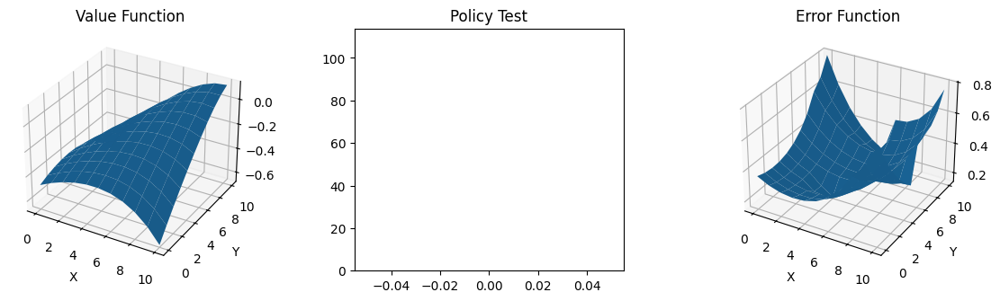

V V V V V   V V V V V 
V V V V V   V V V V V 
> V V V V > V V V V V 
> > > V V   V V V V V 
> > x > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > ^   > > V V V 
> > > > > > > > > V V 
> > > > ^   > > > > V 
^ ^ > > ^   > > > > O 


Mean Square Error = 4.176971525593962
____________________________________________________________________________________________________
Episode: 500
Average: 98.26666666666667
Goal: (6, 10)



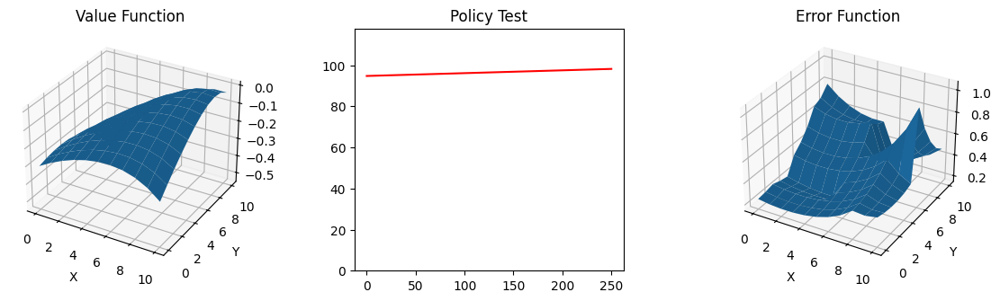

V V V V V   V V V V V 
V V V V x   V V V V V 
V V V V V < V V V V V 
> V V V V   V V V V V 
> > V V V   V V V V V 
    >           V     
> > > > V   V V V V < 
> > > > V   V V V V < 
> > > > > > > V V V < 
> > > > ^   > > V < < 
> > > > ^   O > ^ < < 


Mean Square Error = 4.626769378503133
____________________________________________________________________________________________________
Episode: 750
Average: 76.43333333333334
Goal: (9, 9)



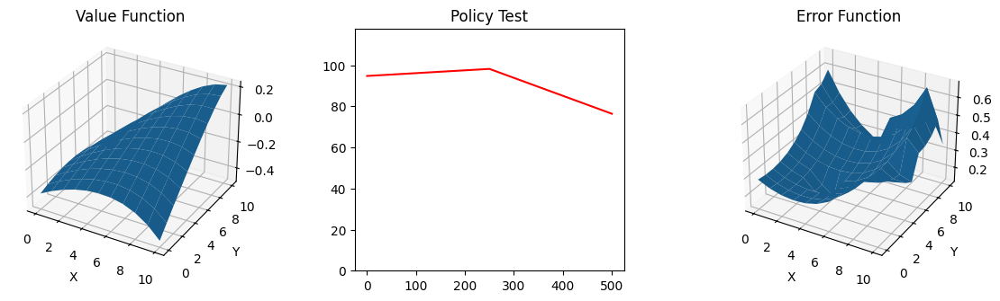

V V V V V   V V V V V 
V V V V V   V V V V V 
> V x V V > V V V V V 
> > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > > > V V 
> > > > ^   > > > O V 
^ > > > ^   > > > > ^ 


Mean Square Error = 3.754082503810471
____________________________________________________________________________________________________
Episode: 1000
Average: 52.2
Goal: (6, 7)



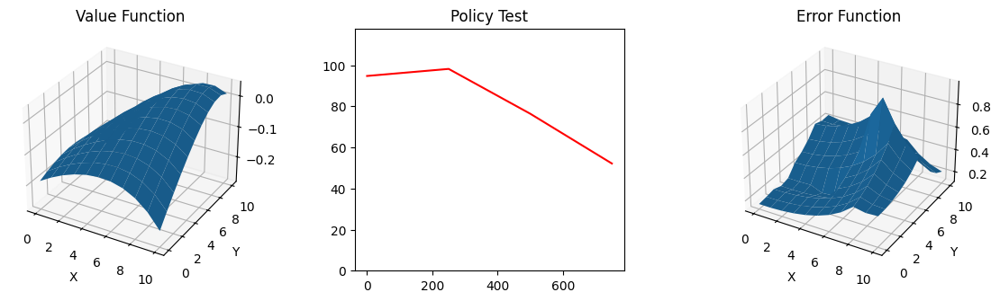

V V V V V   V V V V V 
V V V V V   V V V V V 
> V V V V > V V V V V 
x > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > ^   O > V V < 
> > > > > > > > > V < 
> > > > ^   > > > ^ < 
^ ^ ^ > ^   > ^ ^ ^ ^ 


Mean Square Error = 4.182946184915095
____________________________________________________________________________________________________
Episode: 1250
Average: 56.6
Goal: (9, 7)



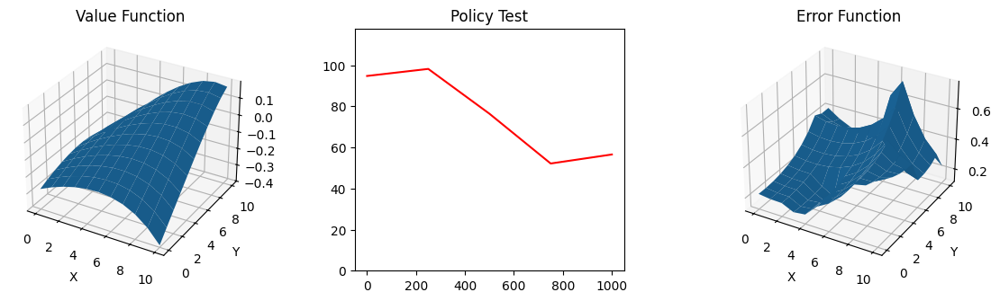

V V V V V   V V V V V 
x V V V V   V V V V V 
> > V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > ^   > > > O V 
> > > > > > > > > > V 
> > > > ^   > > > > V 
^ ^ ^ > ^   > > > > ^ 


Mean Square Error = 3.8736008360640968
____________________________________________________________________________________________________
Episode: 1500
Average: 59.53333333333331
Goal: (10, 9)



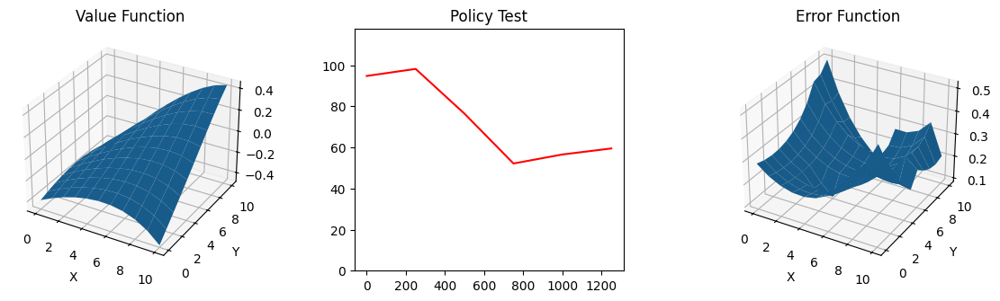

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> > x V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > ^   > > > > O 
^ > > > ^   > > > > ^ 


Mean Square Error = 2.687555060004657
____________________________________________________________________________________________________
Episode: 1750
Average: 76.3
Goal: (8, 6)



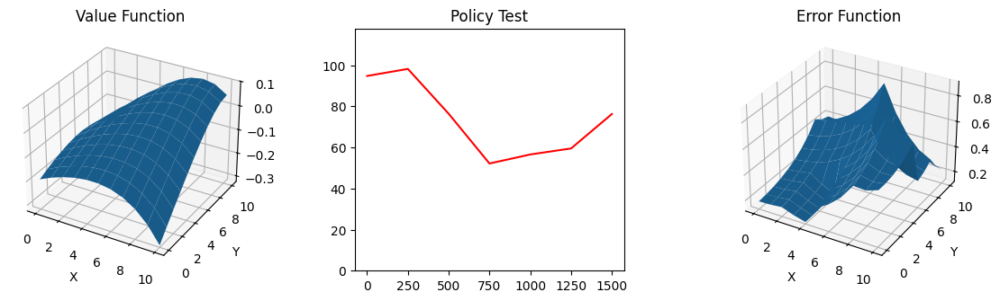

V V V V x   V V V V V 
> V V V V   V V V V V 
> > V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > O V V 
> > > > ^   > > > V V 
> > > > > > > > > > < 
^ ^ > > ^   > > > ^ ^ 
^ ^ ^ ^ ^   ^ ^ ^ ^ ^ 


Mean Square Error = 4.643022270956314
____________________________________________________________________________________________________
Episode: 2000
Average: 53.166666666666664
Goal: (6, 10)



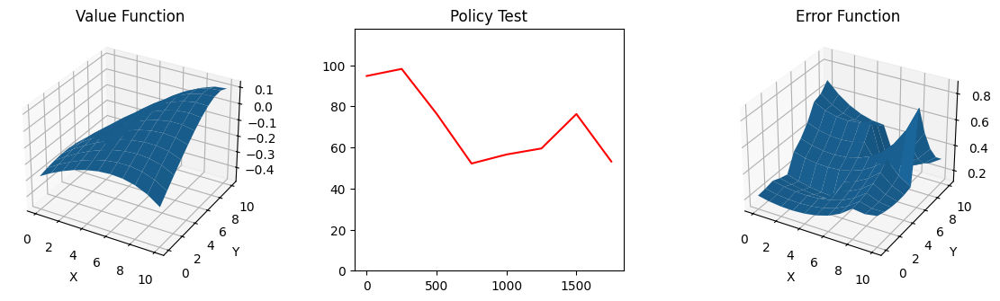

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V V < V V V V V 
V V V V V   V V V V V 
> x V V V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   V V V V V 
> > > > > > > V V V V 
> > > > ^   > > V V < 
> > > > ^   O > > < < 


Mean Square Error = 3.7747636809902967
____________________________________________________________________________________________________
Episode: 2250
Average: 49.6
Goal: (7, 7)



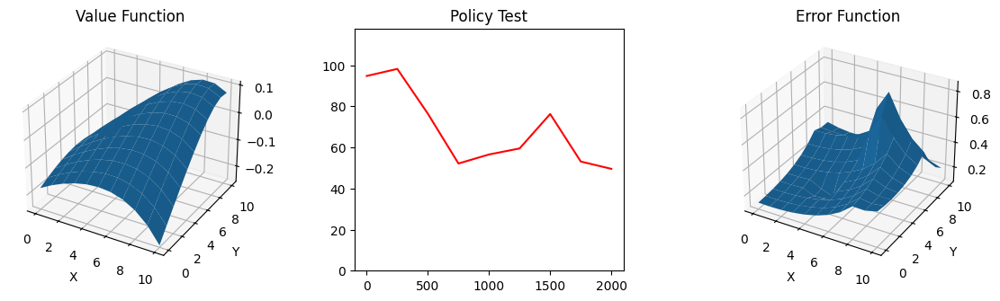

V V V V V   V V V V V 
V V V V V   V V V V V 
> > V V V > V V V V V 
> > x V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > ^   > O V V V 
> > > > > > > > > > < 
> > > > ^   > > > ^ ^ 
^ ^ ^ > ^   > ^ ^ ^ ^ 


Mean Square Error = 3.4200627134853936
____________________________________________________________________________________________________
Episode: 2500
Average: 31.033333333333335
Goal: (6, 6)



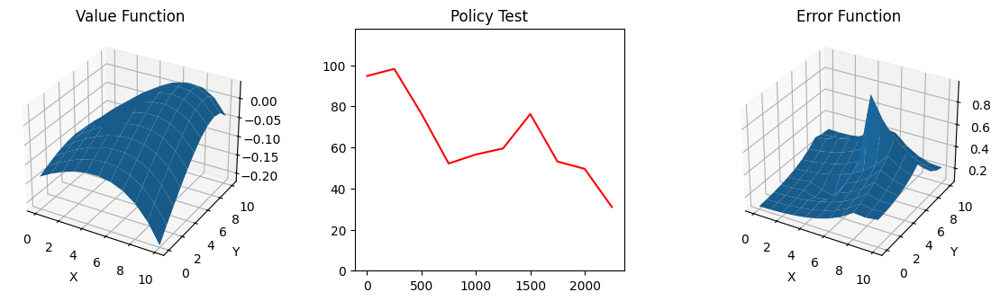

V V V V V   V V V V V 
V V V V x   V V V V V 
> > V V V > V V V V V 
> > > V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   O V V V < 
> > > > ^   > > V < < 
> > > > > > > > ^ < < 
^ ^ ^ > ^   ^ ^ ^ ^ ^ 
^ ^ ^ ^ ^   ^ ^ ^ ^ ^ 


Mean Square Error = 3.3125141494888966
____________________________________________________________________________________________________
Episode: 2750
Average: 38.266666666666666
Goal: (7, 10)



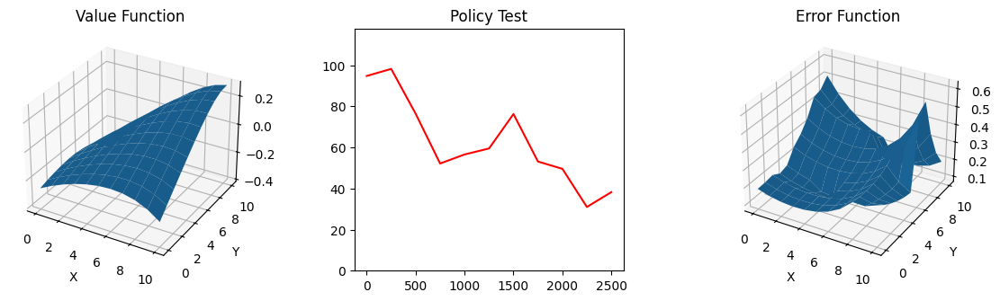

V V V V V   V V V V V 
V V V V V   V V V V V 
V V x V V > V V V V V 
> V V V V   V V V V V 
> > > V V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   > V V V V 
> > > > > > > > V V V 
> > > > ^   > > > V V 
> > > > ^   > O > > < 


Mean Square Error = 2.7207047241832303
____________________________________________________________________________________________________
Episode: 3000
Average: 40.83333333333334
Goal: (8, 8)



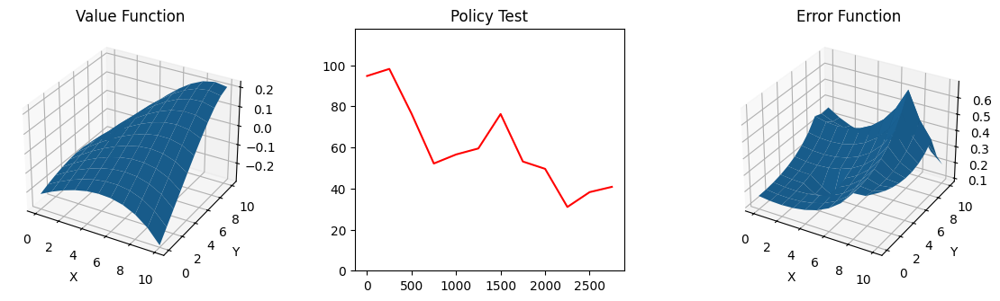

V V V V V   V V V V V 
V V V V V   V V V V V 
> V V V V > V V V V V 
> > > V V   V V V V V 
> > > x V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > ^   > > > V V 
> > > > > > > > O > V 
> > > > ^   > > > > V 
^ ^ > > ^   > > > > ^ 


Mean Square Error = 3.253543502960716
____________________________________________________________________________________________________
Episode: 3250
Average: 35.0
Goal: (7, 6)



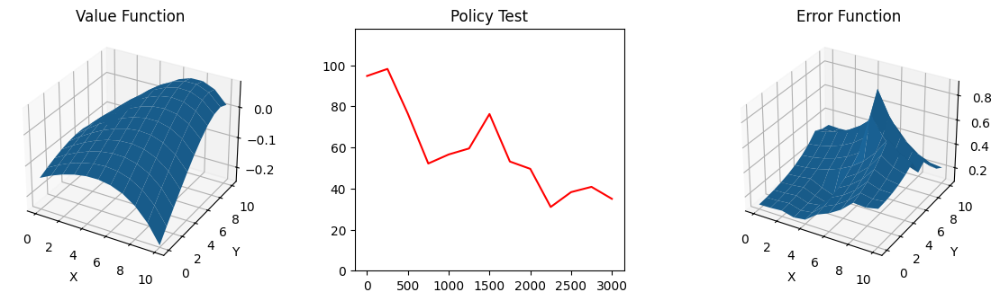

V V V V V   V V V V V 
V V V V V   V V V V V 
> > V V V > V V V V V 
x > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > O V V V 
> > > > ^   > > > V < 
> > > > > > > > > ^ < 
^ ^ ^ > ^   > ^ ^ ^ ^ 
^ ^ ^ ^ ^   ^ ^ ^ ^ ^ 


Mean Square Error = 3.6895163036510734
____________________________________________________________________________________________________
Episode: 3500
Average: 29.3
Goal: (8, 7)



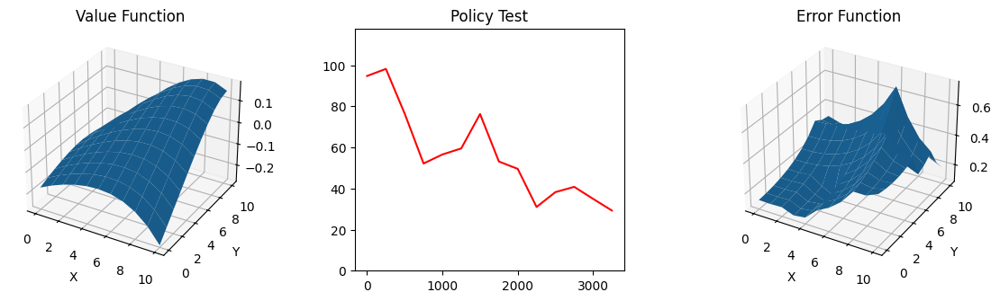

V V V V V   V V V V V 
V V V V V   V V V V V 
> > V V V > V V V V V 
> > > > V   V V V V V 
> > > x V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > ^   > > O V V 
> > > > > > > > > > V 
^ > > > ^   > > > > ^ 
^ ^ ^ ^ ^   > > ^ ^ ^ 


Mean Square Error = 3.552514423071419
____________________________________________________________________________________________________
Episode: 3750
Average: 26.866666666666667
Goal: (7, 8)



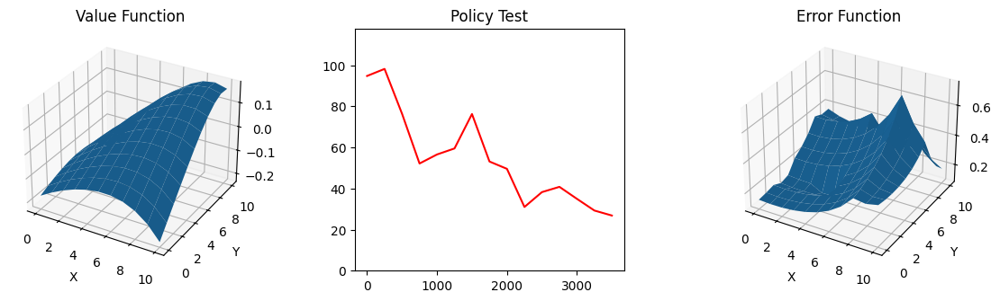

V V V V V   V V V V V 
V V V V V   V V V V V 
V V x V V > V V V V V 
> > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > O > V V 
> > > > ^   > > > > < 
^ ^ > > ^   > > > ^ ^ 


Mean Square Error = 3.4518895989450287
____________________________________________________________________________________________________
Episode: 4000
Average: 34.3
Goal: (6, 9)



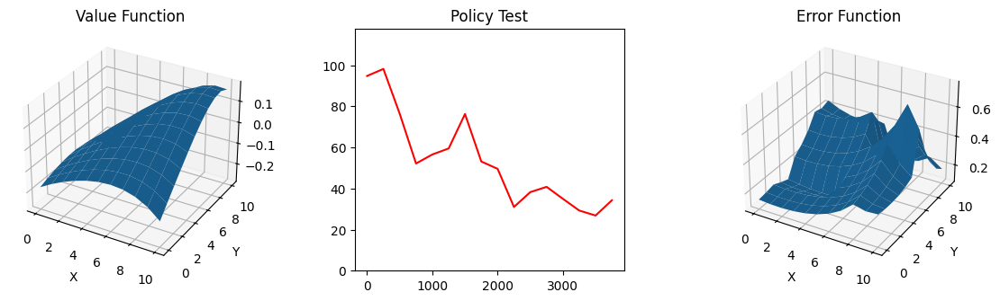

V V x V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> V V V V   V V V V V 
> > > V V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   > V V V V 
> > > > > > > > V V < 
> > > > ^   O > > V < 
> > > > ^   > > > ^ < 


Mean Square Error = 3.269417154602554
____________________________________________________________________________________________________
Episode: 4250
Average: 27.766666666666666
Goal: (8, 7)



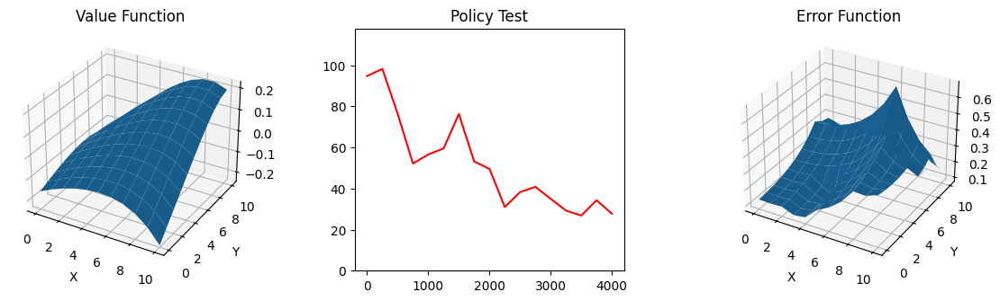

V V V V V   V V V V V 
V V V V V   V V V V V 
> > V V V > V V V V V 
> x > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > ^   > > O V V 
> > > > > > > > > > V 
> > > > ^   > > > > ^ 
^ ^ ^ > ^   > > > ^ ^ 


Mean Square Error = 3.2015699636814277
____________________________________________________________________________________________________
Episode: 4500
Average: 23.766666666666666
Goal: (7, 10)



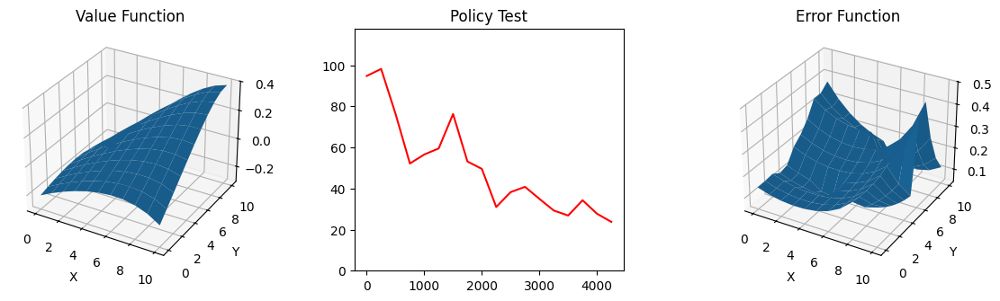

V V V x V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> V V V V   V V V V V 
> > > V V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   > V V V V 
> > > > > > > > V V V 
> > > > ^   > > > V V 
> > > > ^   > O > > < 


Mean Square Error = 1.9840340347951249
____________________________________________________________________________________________________
Episode: 4750
Average: 25.933333333333334
Goal: (9, 7)



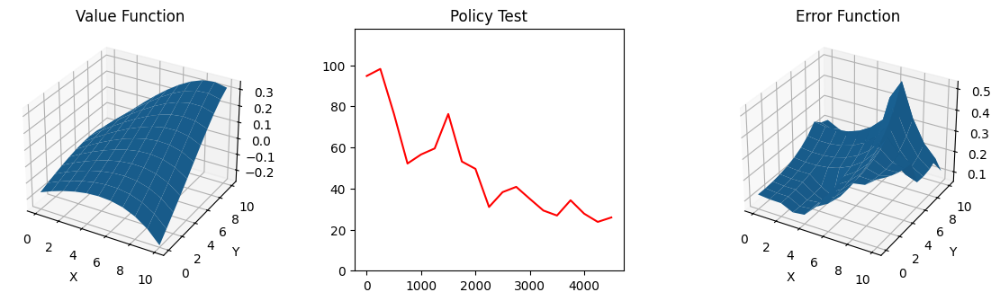

V V V V V   V V V V V 
V V V V V   V V V V V 
> > V x V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > > V V 
> > > > ^   > > > O V 
> > > > > > > > > > V 
^ > > > ^   > > > > ^ 
^ ^ ^ > ^   > > > > ^ 


Mean Square Error = 2.398497269146456
____________________________________________________________________________________________________
Episode: 5000
Average: 21.566666666666666
Goal: (8, 8)



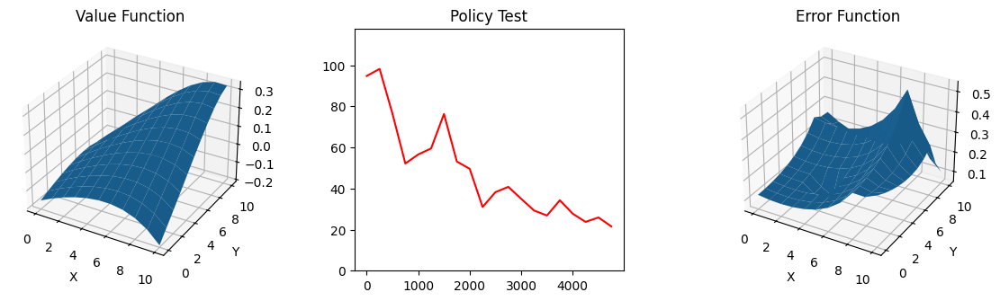

V V V V V   V V V V V 
V V V V V   V V V V V 
> V V x V > V V V V V 
> > > V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > > V V 
> > > > > > > > O > V 
> > > > ^   > > > > V 
^ > > > ^   > > > > ^ 


Mean Square Error = 2.39984941083795
____________________________________________________________________________________________________
Episode: 5250
Average: 20.066666666666666
Goal: (8, 10)



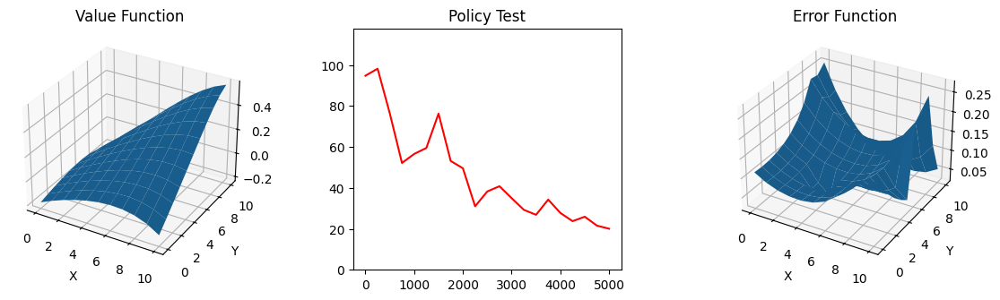

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> V V V V   V V V V V 
> x > V V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   > V V V V 
> > > > > > > > > V V 
> > > > ^   > > > V V 
> > > > ^   > > O > < 


Mean Square Error = 1.2227140251527022
____________________________________________________________________________________________________
Episode: 5500
Average: 19.0
Goal: (9, 9)



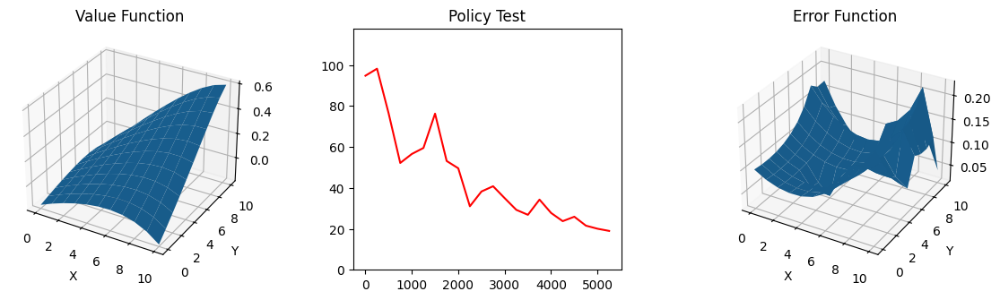

V V V V V   V V V V V 
x V V V V   V V V V V 
V V V V V > V V V V V 
> > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > ^   > > > O V 
> > > > ^   > > > > ^ 


Mean Square Error = 1.1252966153991968
____________________________________________________________________________________________________
Episode: 5750
Average: 20.133333333333333
Goal: (9, 9)



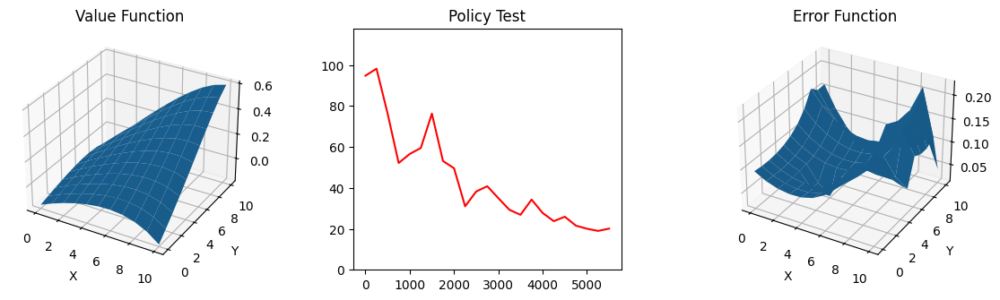

V V V V V   V V V V V 
x V V V V   V V V V V 
V V V V V > V V V V V 
> > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > ^   > > > O V 
^ > > > ^   > > > > ^ 


Mean Square Error = 1.0866304259624522
____________________________________________________________________________________________________
Episode: 6000
Average: 24.6
Goal: (10, 9)



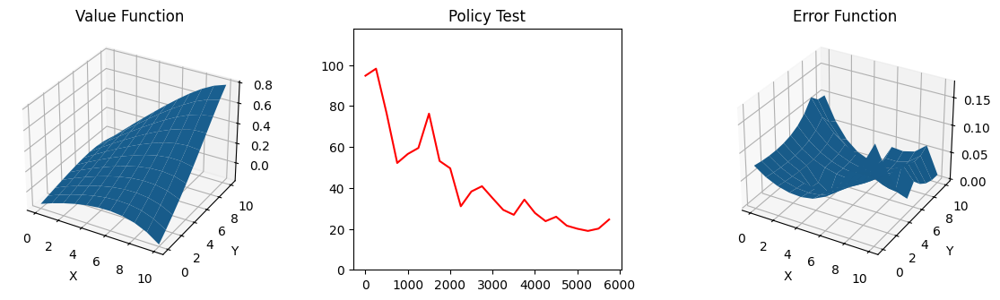

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> > V V V   V V V V V 
> > > > x   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > ^   > > > > O 
^ > > > ^   > > > > ^ 


Mean Square Error = 0.5536555838738354
____________________________________________________________________________________________________
Episode: 6250
Average: 23.0
Goal: (7, 7)



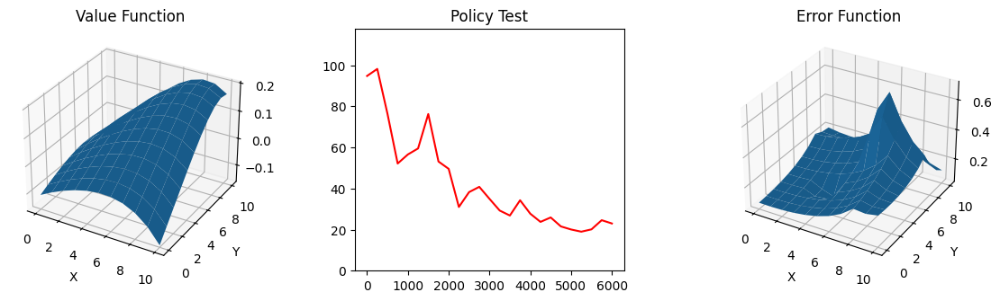

V V V x V   V V V V V 
V V V V V   V V V V V 
> V V V V > V V V V V 
> > > V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > ^   > O > V V 
> > > > > > > > > > < 
> > > > ^   > > > ^ ^ 
^ ^ > > ^   > > ^ ^ ^ 


Mean Square Error = 2.482858426515726
____________________________________________________________________________________________________
Episode: 6500
Average: 19.799999999999997
Goal: (7, 10)



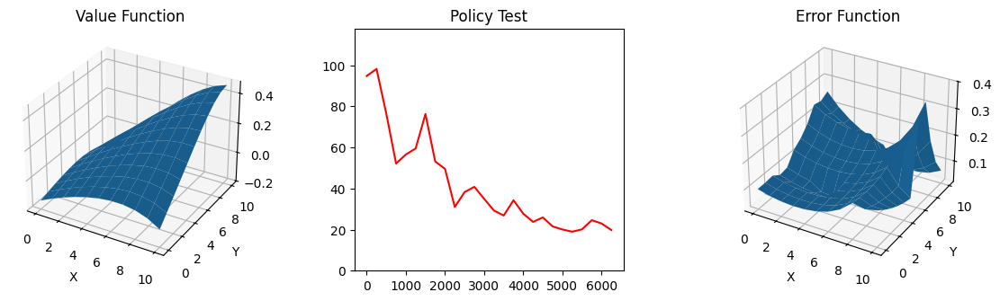

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> V V V V   V V V V V 
x > > V V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   > V V V V 
> > > > > > > > V V V 
> > > > ^   > > > V V 
> > > > ^   > O > > < 


Mean Square Error = 1.395257618052346
____________________________________________________________________________________________________
Episode: 6750
Average: 17.833333333333336
Goal: (10, 10)



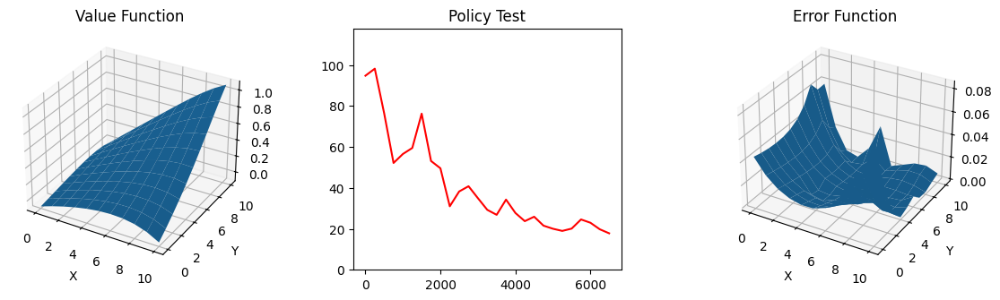

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
V V x V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > ^   > > > > V 
> > > > ^   > > > > O 


Mean Square Error = 0.17142610229763997
____________________________________________________________________________________________________
Episode: 7000
Average: 20.6
Goal: (10, 9)



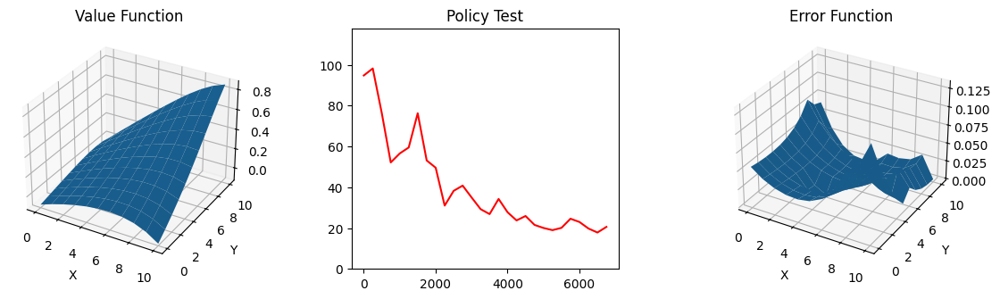

V V V V V   V V V V V 
V x V V V   V V V V V 
V V V V V > V V V V V 
> > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > ^   > > > > O 
^ > > > ^   > > > > ^ 


Mean Square Error = 0.3564646827181655
____________________________________________________________________________________________________
Episode: 7250
Average: 21.399999999999995
Goal: (9, 9)



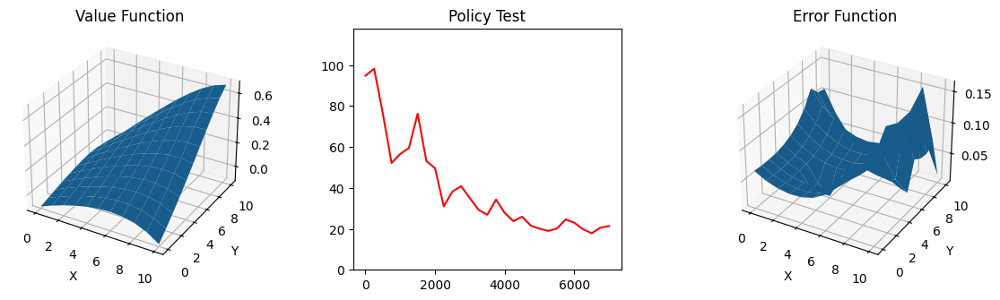

V x V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > ^   > > > O V 
> > > > ^   > > > > ^ 


Mean Square Error = 0.7363935351077491
____________________________________________________________________________________________________
Episode: 7500
Average: 16.133333333333333
Goal: (8, 8)



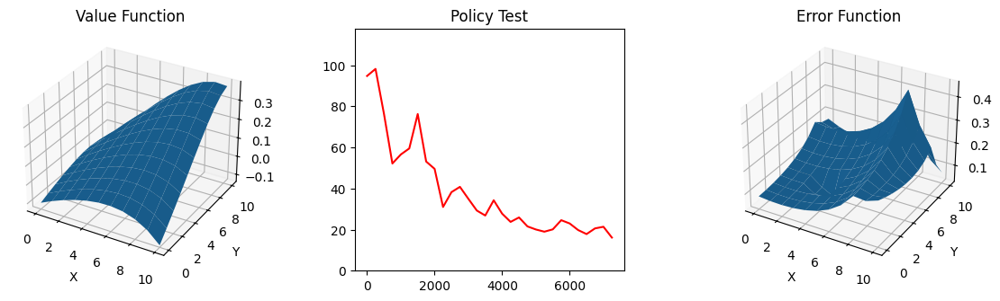

V V V V V   V V V V V 
V V V V V   V V V V V 
> V V V V > V V V V V 
> x > V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > > > V V 
> > > > > > > > O > V 
> > > > ^   > > > > V 
^ > > > ^   > > > > ^ 


Mean Square Error = 1.836457427847685
____________________________________________________________________________________________________
Episode: 7750
Average: 18.5
Goal: (7, 10)



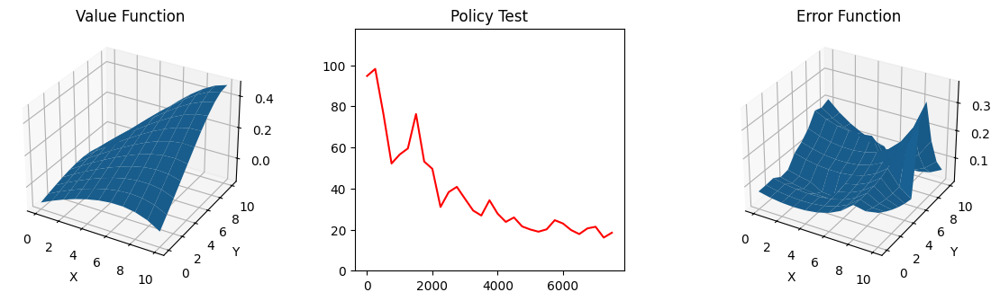

V V V V V   V V V V V 
V V V V V   V V V V V 
x V V V V > V V V V V 
> V V V V   V V V V V 
> > > V V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   > V V V V 
> > > > > > > > V V V 
> > > > ^   > > > V V 
> > > > ^   > O > > < 


Mean Square Error = 1.1909527066836085
____________________________________________________________________________________________________
Episode: 8000
Average: 15.4
Goal: (9, 7)



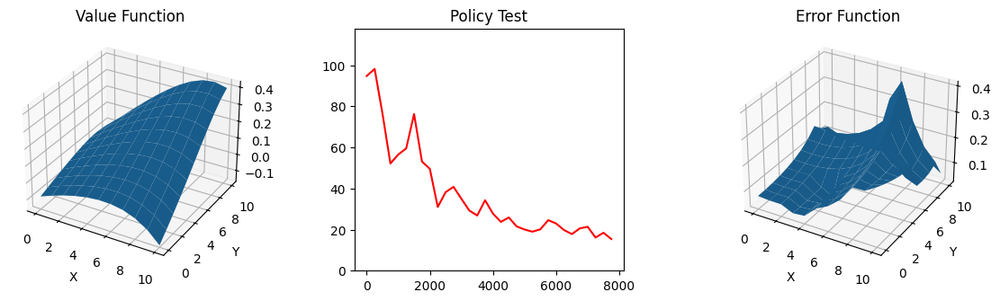

V V x V V   V V V V V 
V V V V V   V V V V V 
> > V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > > V V 
> > > > ^   > > > O V 
> > > > > > > > > > V 
> > > > ^   > > > > ^ 
^ ^ > > ^   > > > > ^ 


Mean Square Error = 1.6463310489131644
____________________________________________________________________________________________________
Episode: 8250
Average: 16.8
Goal: (7, 8)



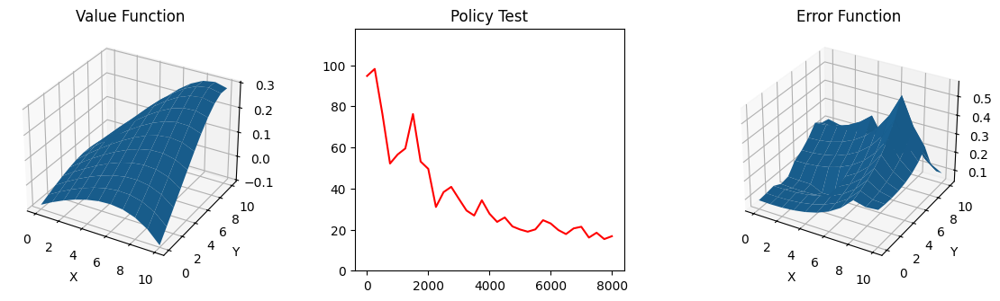

V V V V V   V V V V V 
V V V V V   V V V V V 
> V V V x > V V V V V 
> > > V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > O > V V 
> > > > ^   > > > > < 
^ > > > ^   > > > ^ ^ 


Mean Square Error = 2.306122649614728
____________________________________________________________________________________________________
Episode: 8500
Average: 16.166666666666668
Goal: (9, 7)



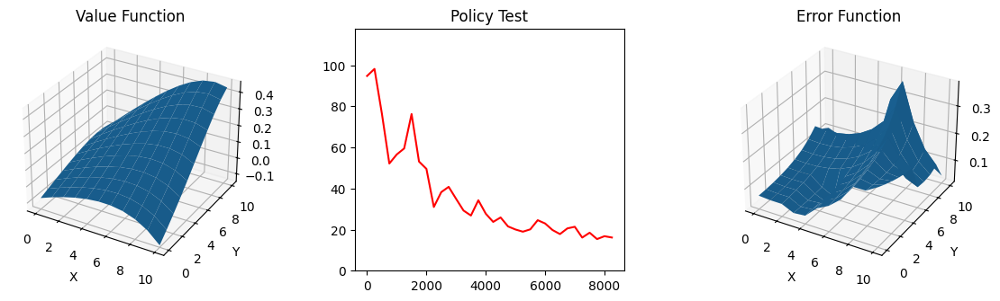

V V V V x   V V V V V 
V V V V V   V V V V V 
> > V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > > V V 
> > > > V   > > > O V 
> > > > > > > > > > V 
> > > > ^   > > > > ^ 
^ ^ > > ^   > > > > ^ 


Mean Square Error = 1.5057753863046328
____________________________________________________________________________________________________
Episode: 8750
Average: 15.63333333333333
Goal: (9, 10)



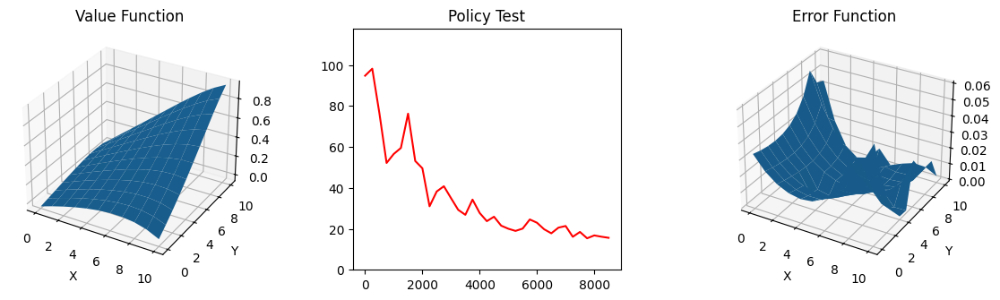

V V V x V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> V V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > > > V V 
> > > > ^   > > > > V 
> > > > ^   > > > O ^ 


Mean Square Error = 0.16471110473420547
____________________________________________________________________________________________________
Episode: 9000
Average: 17.633333333333333
Goal: (7, 7)



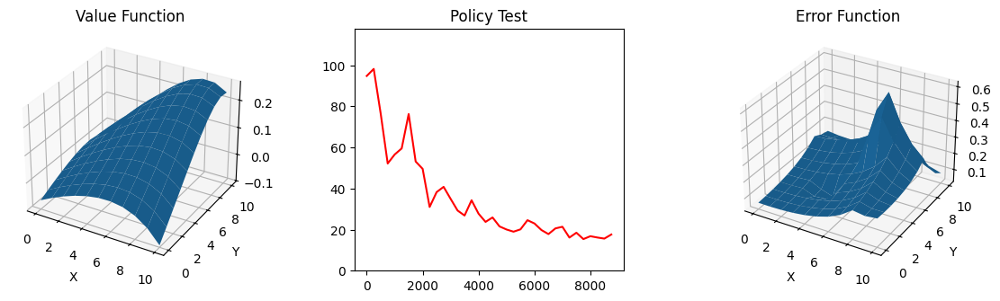

V V V V V   V V V V V 
V V V V V   V V V V V 
> V V V x > V V V V V 
> > > V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > O > V V 
> > > > > > > > > > < 
> > > > ^   > > > ^ ^ 
^ ^ > > ^   > > ^ ^ ^ 


Mean Square Error = 1.9881656438689932
____________________________________________________________________________________________________
Episode: 9250
Average: 17.3
Goal: (6, 7)



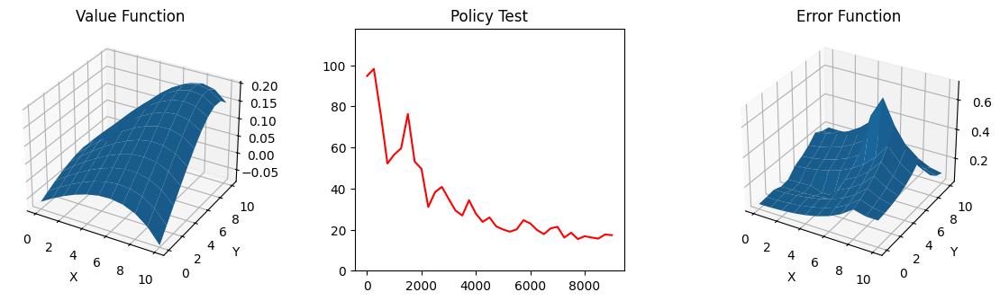

V V V V V   V V V V V 
V V V V V   V V V V V 
> V V V V > V V V V V 
> > > V V   V V V V V 
> x > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   O > V V < 
> > > > > > > > > < < 
> > > > ^   > > ^ ^ < 
^ ^ > > ^   > ^ ^ ^ ^ 


Mean Square Error = 2.4427681014356732
____________________________________________________________________________________________________
Episode: 9500
Average: 16.53333333333333
Goal: (7, 8)



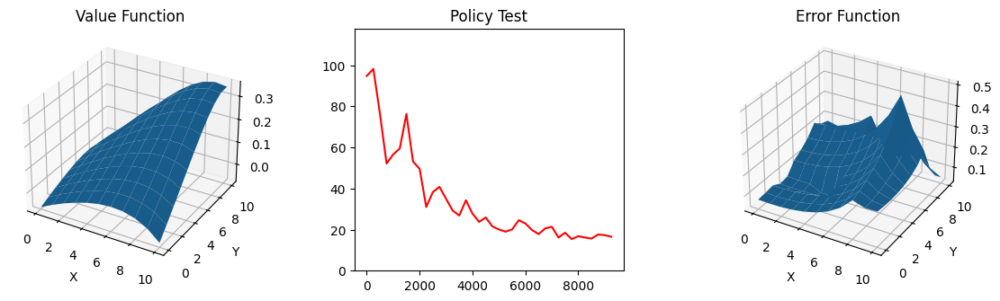

V V x V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> > > V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > O > V V 
> > > > ^   > > > > < 
> > > > ^   > > > ^ ^ 


Mean Square Error = 1.9787546354453511
____________________________________________________________________________________________________
Episode: 9750
Average: 15.133333333333333
Goal: (6, 9)



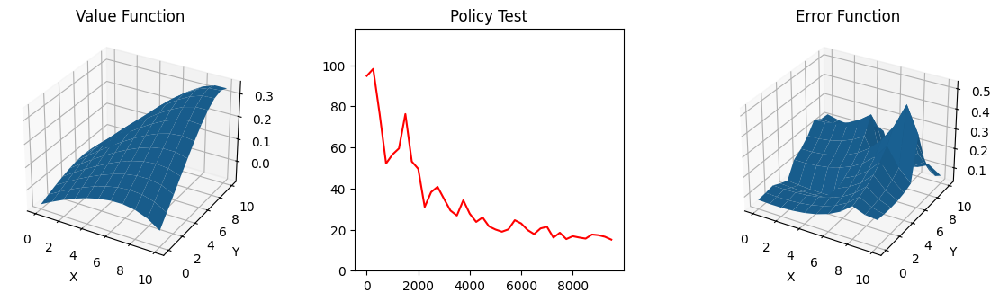

V V V V V   V V V V V 
V V V V V   V V V V V 
V V x V V > V V V V V 
> V V V V   V V V V V 
> > > V V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   > V V V V 
> > > > > > > > V V V 
> > > > ^   O > > V < 
> > > > ^   > > > ^ < 


Mean Square Error = 1.8819027311366396
____________________________________________________________________________________________________
Episode: 10000
Average: 15.066666666666666
Goal: (6, 7)



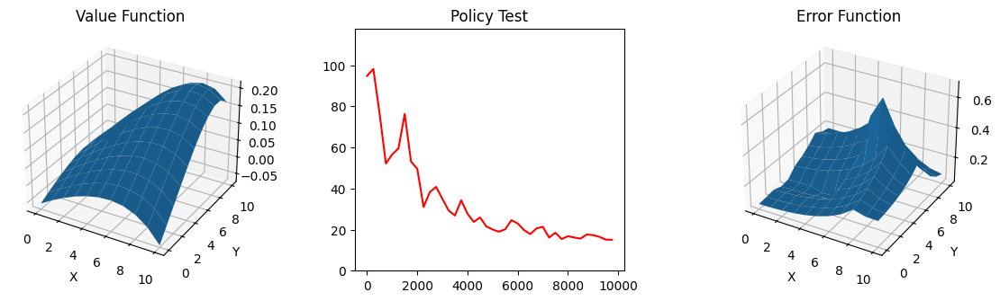

V V V V V   V V V V V 
V V V V V   V V V V V 
> V V V x > V V V V V 
> > > V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   O > V V < 
> > > > > > > > > < < 
> > > > ^   > > ^ ^ < 
^ > > > ^   > ^ ^ ^ ^ 


Mean Square Error = 2.341482319558022
____________________________________________________________________________________________________
Episode: 10250
Average: 13.7
Goal: (6, 10)



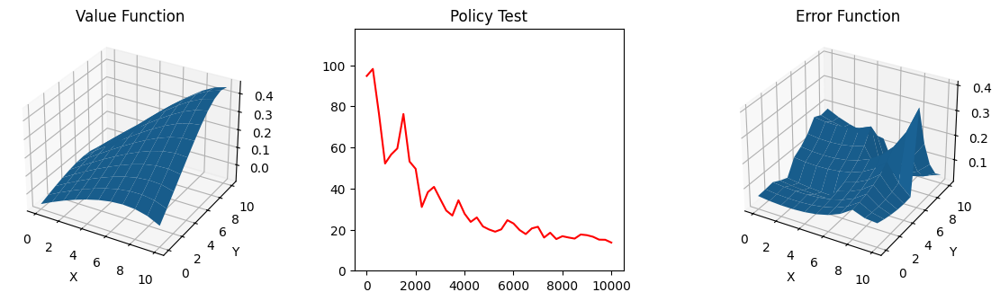

V V V V V   V V V V V 
V V V V V   V V V V V 
V x V V V > V V V V V 
> V V V V   V V V V V 
> > > V V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   V V V V V 
> > > > > > > V V V V 
> > > > V   > > V V V 
> > > > ^   O > > > < 


Mean Square Error = 1.1819665267476505
____________________________________________________________________________________________________
Episode: 10500
Average: 14.233333333333333
Goal: (10, 8)



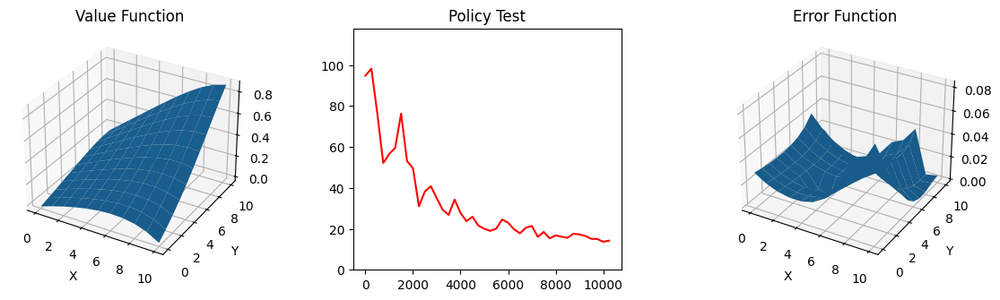

V V V V V   V V V V V 
V V V V x   V V V V V 
V V V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > > V V 
> > > > V   > > > > V 
> > > > > > > > > > O 
> > > > ^   > > > > V 
^ > > > ^   > > > > ^ 


Mean Square Error = 0.23464438991884407
____________________________________________________________________________________________________
Episode: 10750
Average: 13.2
Goal: (8, 9)



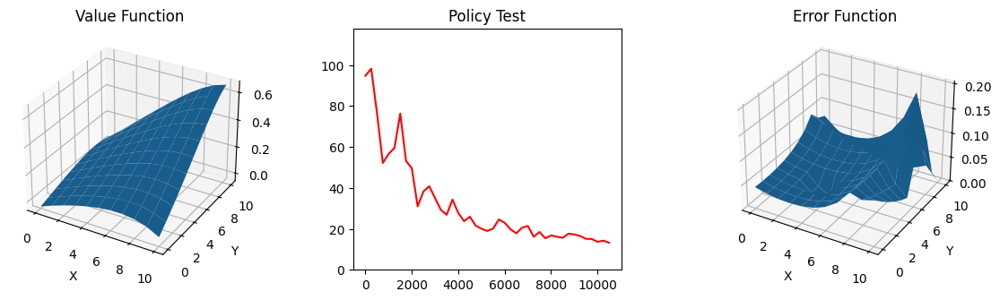

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V x > V V V V V 
> > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > > > V V 
> > > > ^   > > O > V 
> > > > ^   > > > > ^ 


Mean Square Error = 0.6489365165983028
____________________________________________________________________________________________________
Episode: 11000
Average: 13.0
Goal: (6, 10)



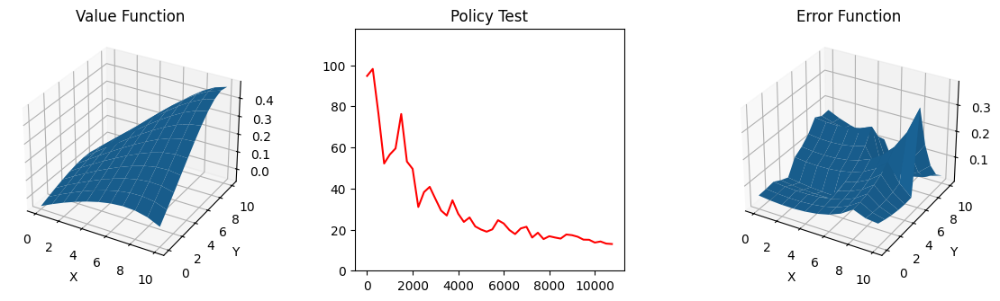

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> V x V V   V V V V V 
> > > V V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   V V V V V 
> > > > > > > V V V V 
> > > > V   > > V V V 
> > > > ^   O > > > < 


Mean Square Error = 1.0627603856656784
____________________________________________________________________________________________________
Episode: 11250
Average: 15.166666666666666
Goal: (8, 9)



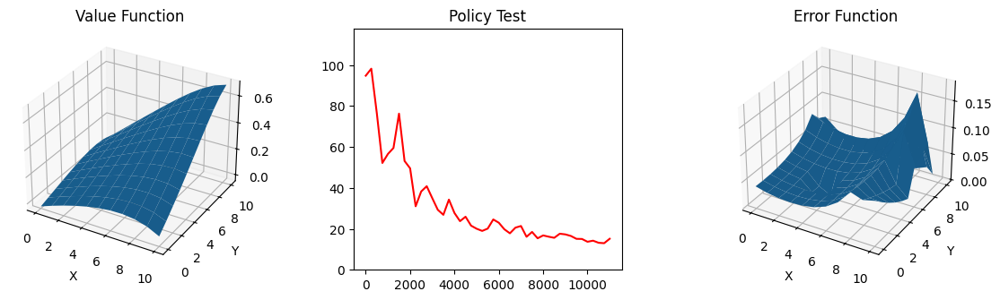

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
x > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > > > V V 
> > > > ^   > > O > V 
> > > > ^   > > > > ^ 


Mean Square Error = 0.5711360839654226
____________________________________________________________________________________________________
Episode: 11500
Average: 13.866666666666667
Goal: (10, 10)



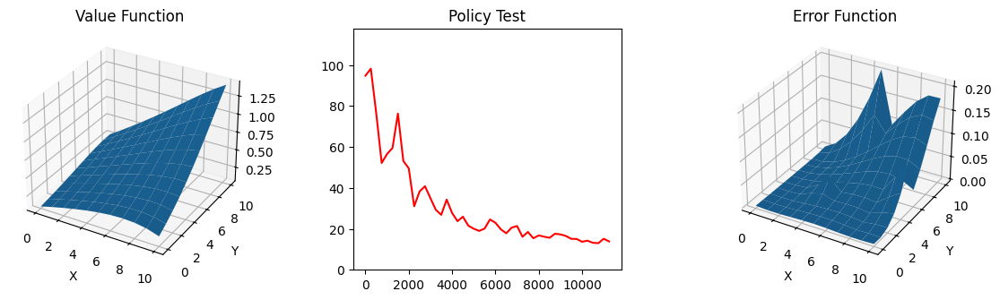

V V V V V   V V V V V 
V V x V V   V V V V V 
V V V V V > V V V V V 
V V V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > V   > > > > V 
> > > > ^   > > > > O 


Mean Square Error = 0.38529979009116994
____________________________________________________________________________________________________
Episode: 11750
Average: 13.633333333333333
Goal: (8, 7)



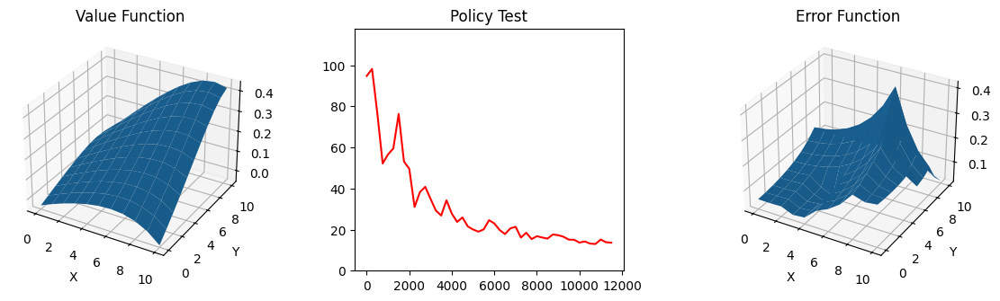

V V V V V   V V V V V 
V V V V V   V V V V V 
> > V x V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > > O V V 
> > > > > > > > > > V 
> > > > ^   > > > > ^ 
^ > > > ^   > > > > ^ 


Mean Square Error = 1.5936543441021451
____________________________________________________________________________________________________
Episode: 12000
Average: 12.933333333333334
Goal: (6, 6)



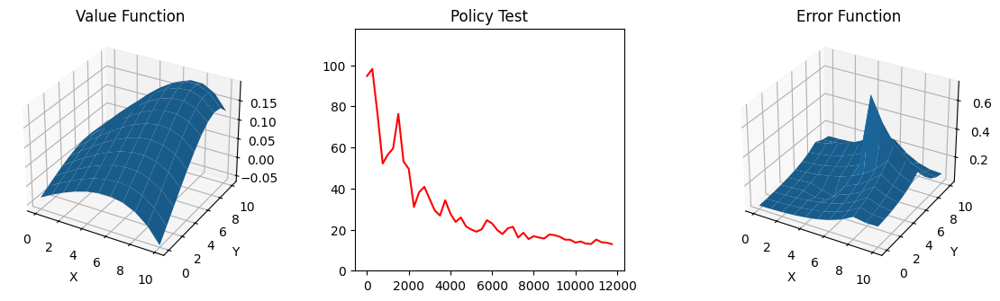

V V V V V   V V V V V 
V x V V V   V V V V V 
> > V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   O > V V V 
> > > > ^   > > > V < 
> > > > > > > > > ^ < 
> > > > ^   > > ^ ^ ^ 
^ ^ ^ ^ ^   ^ ^ ^ ^ ^ 


Mean Square Error = 1.8972307068758267
____________________________________________________________________________________________________
Episode: 12250
Average: 11.433333333333334
Goal: (7, 6)



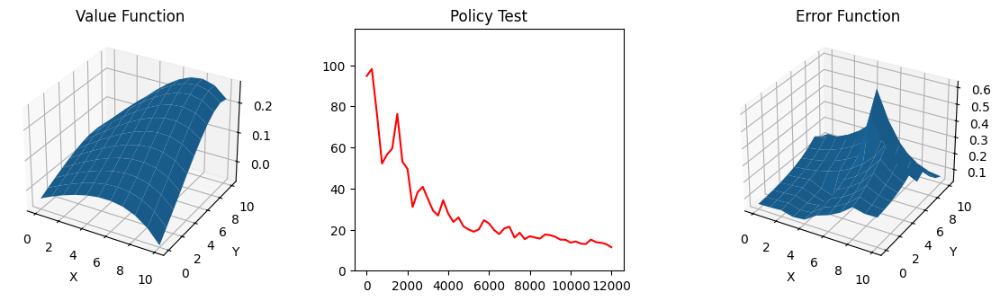

V V V V V   V V V V V 
V V V V V   V V V V V 
> > V V V > V V V V V 
x > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > O V V V 
> > > > ^   > > > V V 
> > > > > > > > > > < 
> > > > ^   > > > ^ ^ 
^ ^ > > ^   > ^ ^ ^ ^ 


Mean Square Error = 2.029438584879129
____________________________________________________________________________________________________
Episode: 12500
Average: 15.266666666666667
Goal: (10, 9)



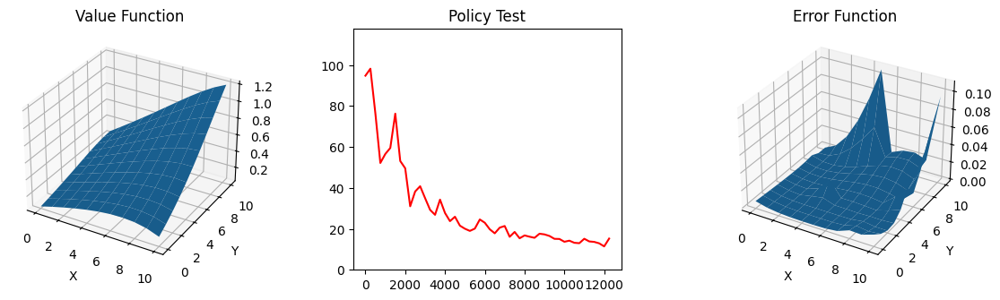

V V V V x   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
V V V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > > V V 
> > > > V   > > > > V 
> > > > > > > > > > V 
> > > > ^   > > > > O 
> > > > ^   > > > > ^ 


Mean Square Error = 0.10659448984149283
____________________________________________________________________________________________________
Episode: 12750
Average: 12.5
Goal: (7, 7)



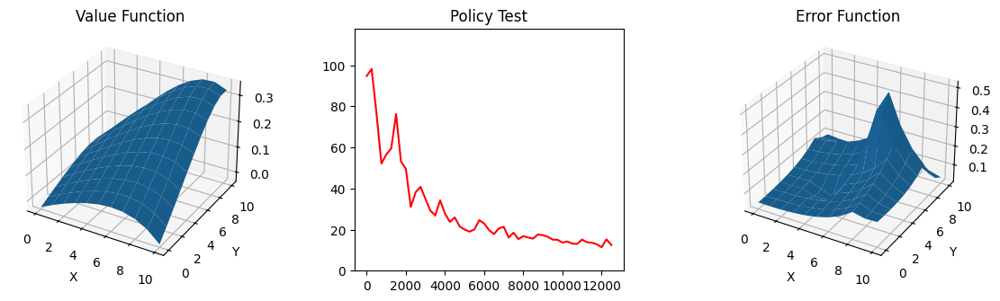

V V V V V   V V V V V 
V V V x V   V V V V V 
> V V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > O > V V 
> > > > > > > > > > V 
> > > > ^   > > > > ^ 
> > > > ^   > > > ^ ^ 


Mean Square Error = 1.4780826157568987
____________________________________________________________________________________________________
Episode: 13000
Average: 13.933333333333334
Goal: (7, 8)



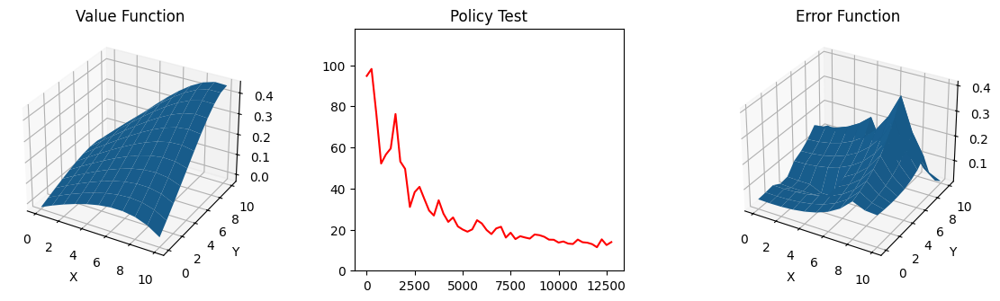

V V V V V   V V V V V 
V V x V V   V V V V V 
V V V V V > V V V V V 
> > > V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > O > V V 
> > > > ^   > > > > V 
> > > > ^   > > > > ^ 


Mean Square Error = 1.4445088803271904
____________________________________________________________________________________________________
Episode: 13250
Average: 13.3
Goal: (9, 8)



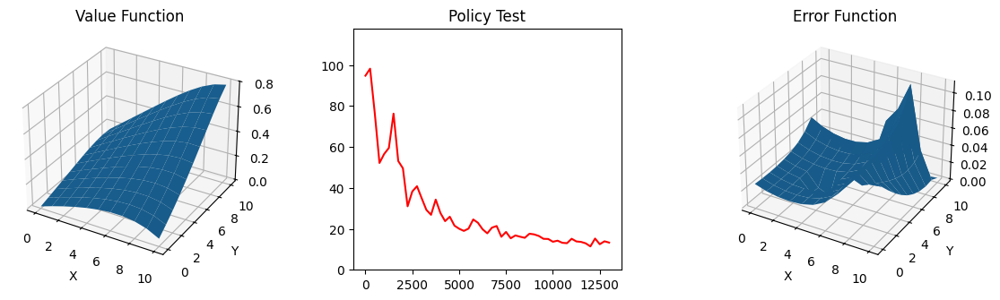

V V x V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > > > V V 
> > > > > > > > > O V 
> > > > ^   > > > > V 
> > > > ^   > > > > ^ 


Mean Square Error = 0.3497399236921827
____________________________________________________________________________________________________
Episode: 13500
Average: 12.566666666666666
Goal: (9, 7)



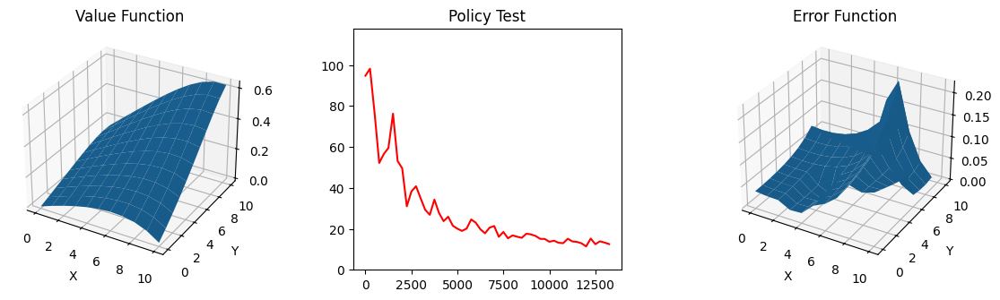

V V V V x   V V V V V 
V V V V V   V V V V V 
> V V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   > V V V V 
    >           V     
> > > > V   > > > V V 
> > > > V   > > > O V 
> > > > > > > > > > V 
> > > > ^   > > > > V 
^ > > > ^   > > > > ^ 


Mean Square Error = 0.7289855932221595
____________________________________________________________________________________________________
Episode: 13750
Average: 10.5
Goal: (7, 7)



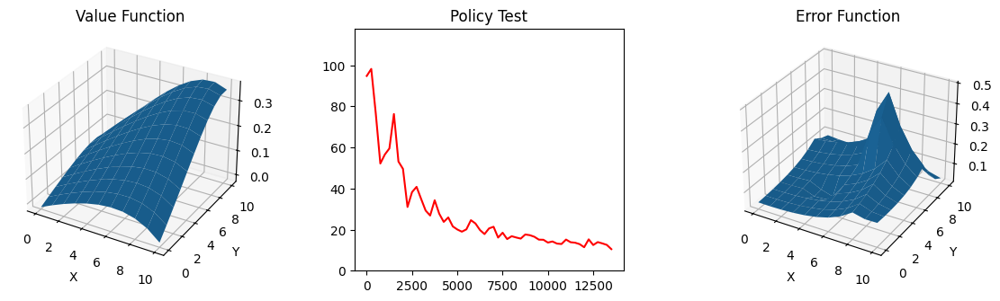

V V V V V   V V V V V 
V V V V V   V V V V V 
> V V V V > V V V V V 
> x > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > O > V V 
> > > > > > > > > > V 
> > > > ^   > > > > ^ 
> > > > ^   > > > ^ ^ 


Mean Square Error = 1.3624563499903146
____________________________________________________________________________________________________
Episode: 14000
Average: 10.5
Goal: (9, 6)



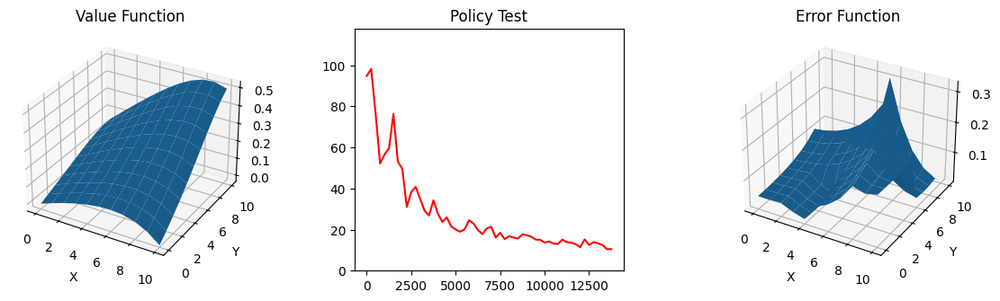

V V V V V   V V V V V 
V x V V V   V V V V V 
> > > V V > V V V V V 
> > > > V   V V V V V 
> > > > V   > V V V V 
    >           >     
> > > > V   > > > O V 
> > > > V   > > > > V 
> > > > > > > > > > V 
> > > > ^   > > > > ^ 
^ ^ > > ^   > > > > ^ 


Mean Square Error = 1.156813333224297
____________________________________________________________________________________________________
Episode: 14250
Average: 12.6
Goal: (10, 6)



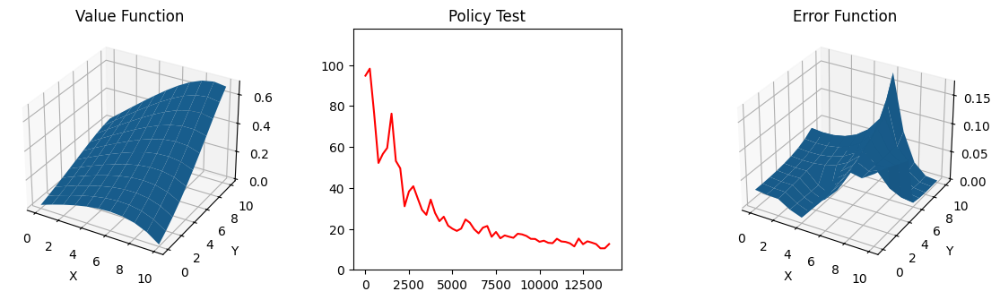

V V V V V   V V V V V 
V V V V V   V V V V V 
> x > > V > V V V V V 
> > > > V   > V V V V 
> > > > V   > > V V V 
    >           >     
> > > > V   > > > > O 
> > > > V   > > > > V 
> > > > > > > > > > V 
> > > > ^   > > > > V 
^ ^ > > ^   > > > > ^ 


Mean Square Error = 0.5571623839460176
____________________________________________________________________________________________________
Episode: 14500
Average: 11.8
Goal: (8, 9)



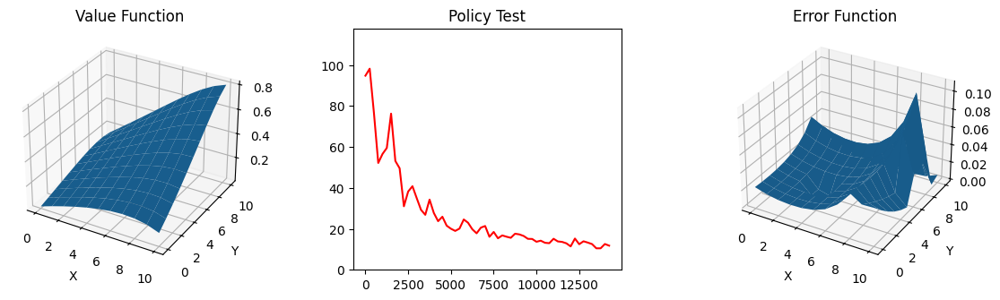

V V V V V   V V V V V 
V V V V V   V V V V V 
V V x V V > V V V V V 
> > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > > > V V 
> > > > V   > > O > V 
> > > > ^   > > > > ^ 


Mean Square Error = 0.27735486773063633
____________________________________________________________________________________________________
Episode: 14750
Average: 12.366666666666667
Goal: (8, 10)



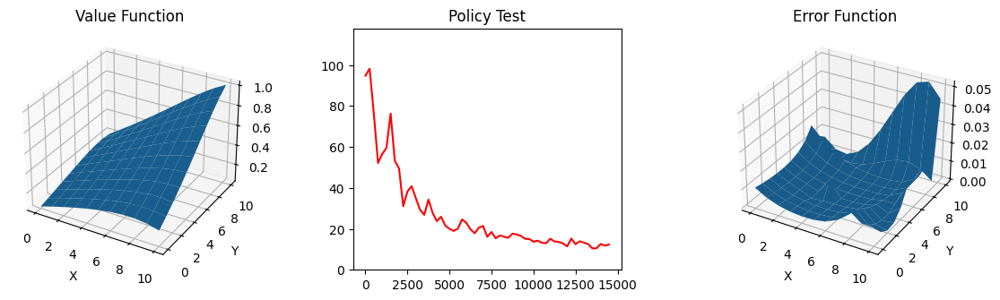

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
x V V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > > > V V 
> > > > V   > > > V V 
> > > > ^   > > O > < 


Mean Square Error = 0.06765048226034186
____________________________________________________________________________________________________
Episode: 15000
Average: 10.966666666666667
Goal: (6, 10)



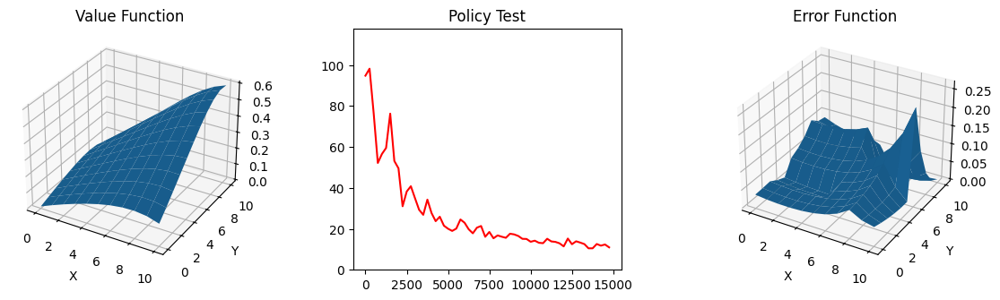

V V V V V   V V V V V 
V V V V V   V V V V V 
x V V V V > V V V V V 
> V V V V   V V V V V 
> > > V V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   V V V V V 
> > > > > > > V V V V 
> > > > V   > > V V V 
> > > > ^   O > > > < 


Mean Square Error = 0.6056650464688161
____________________________________________________________________________________________________
Episode: 15250
Average: 12.733333333333333
Goal: (6, 6)



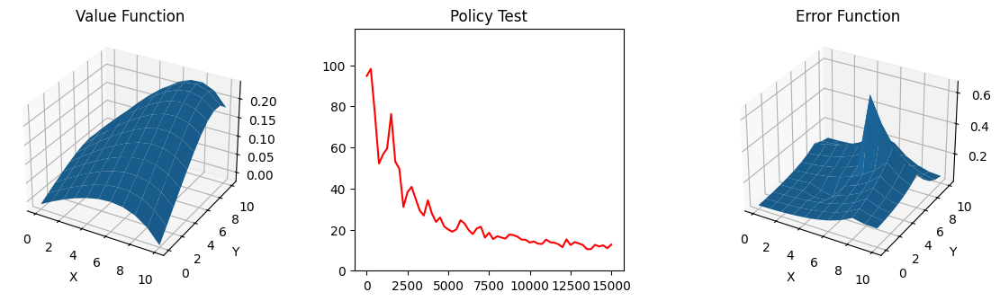

V x V V V   V V V V V 
V V V V V   V V V V V 
> > V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   O > V V V 
> > > > V   > > > V < 
> > > > > > > > > ^ < 
> > > > ^   > > ^ ^ ^ 
^ ^ > > ^   ^ ^ ^ ^ ^ 


Mean Square Error = 1.5976268456133218
____________________________________________________________________________________________________
Episode: 15500
Average: 10.266666666666667
Goal: (7, 6)



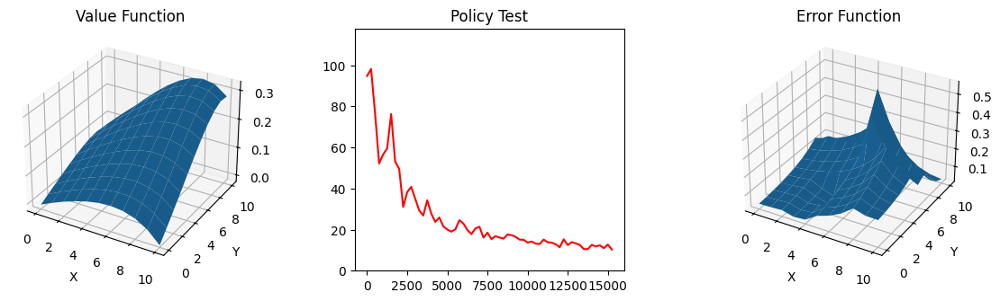

V V V V V   V V V V V 
V V V V V   V V V V V 
> > > V V > V V V V V 
> > > x V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > O V V V 
> > > > V   > > > V V 
> > > > > > > > > > < 
> > > > ^   > > > ^ ^ 
^ > > > ^   > > ^ ^ ^ 


Mean Square Error = 1.6699245390432482
____________________________________________________________________________________________________
Episode: 15750
Average: 11.9
Goal: (7, 6)



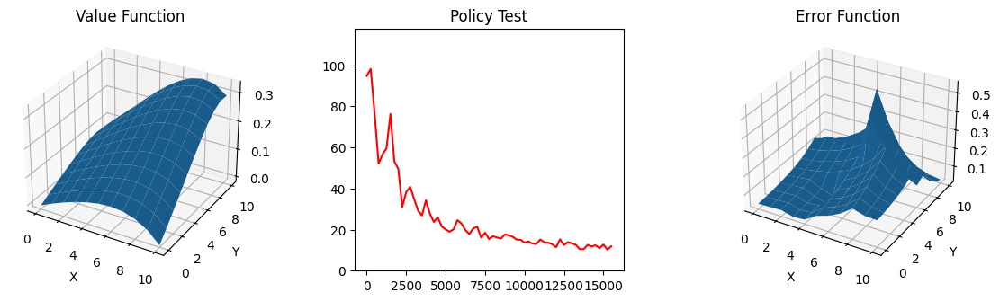

V V V V V   V V V V V 
V V V V V   V V V V V 
> > > x V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > O V V V 
> > > > V   > > > V V 
> > > > > > > > > > < 
> > > > ^   > > > ^ ^ 
^ > > > ^   > > ^ ^ ^ 


Mean Square Error = 1.6313030289844597
____________________________________________________________________________________________________
Episode: 16000
Average: 11.166666666666666
Goal: (8, 6)



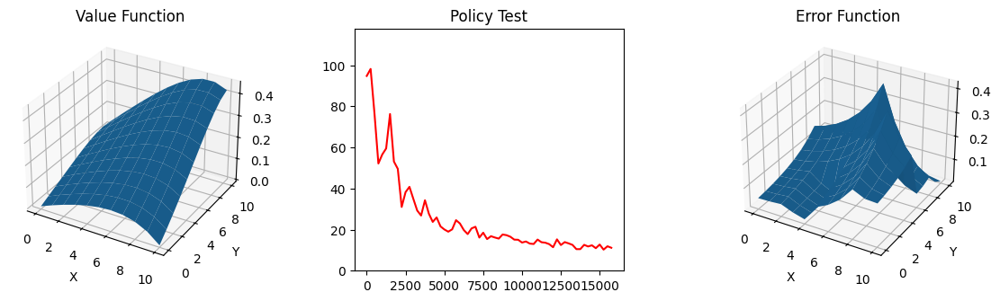

V V V V V   V V V V V 
V V V V V   V V V V V 
> > > V V > V V V V V 
> > > x V   V V V V V 
> > > > V   > V V V V 
    >           V     
> > > > V   > > O V V 
> > > > V   > > > > V 
> > > > > > > > > > V 
> > > > ^   > > > > ^ 
^ > > > ^   > > > > ^ 


Mean Square Error = 1.6333101045350047
____________________________________________________________________________________________________
Episode: 16250
Average: 12.166666666666666
Goal: (7, 6)



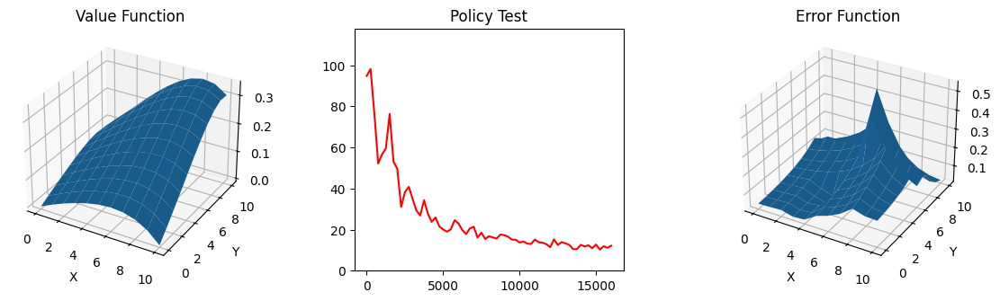

V V V V V   V V V V V 
V V V V V   V V V V V 
> > > V V > V V V V V 
x > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > O V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > ^   > > > > ^ 
^ > > > ^   > > ^ ^ ^ 


Mean Square Error = 1.5807978600316501
____________________________________________________________________________________________________
Episode: 16500
Average: 10.466666666666667
Goal: (6, 6)



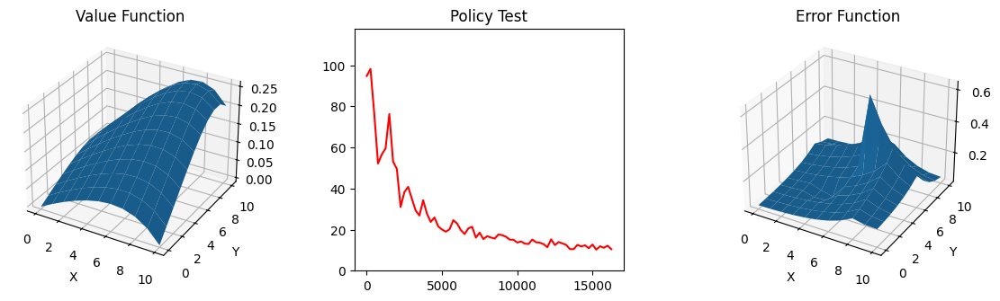

V V V V V   V V V V V 
V V V V V   V V V V V 
> > V V V > V V V V V 
> > > > V   V V V V V 
> > > x V   V V V V V 
    >           V     
> > > > V   O > V V V 
> > > > V   > > > V < 
> > > > > > > > > ^ < 
> > > > ^   > > ^ ^ ^ 
^ > > > ^   > ^ ^ ^ ^ 


Mean Square Error = 1.4926329862185954
____________________________________________________________________________________________________
Episode: 16750
Average: 11.2
Goal: (6, 8)



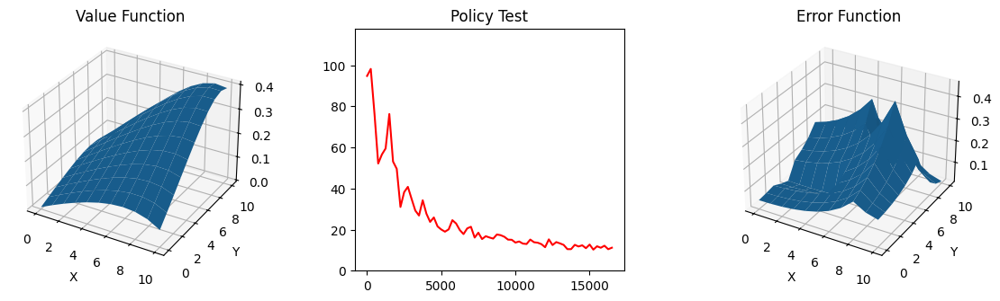

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> > V V V   V V V V V 
> x > > V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   > V V V V 
> > > > > > O > V V V 
> > > > ^   > > > V < 
> > > > ^   > > > ^ < 


Mean Square Error = 1.661370359440028
____________________________________________________________________________________________________
Episode: 17000
Average: 12.666666666666666
Goal: (9, 10)



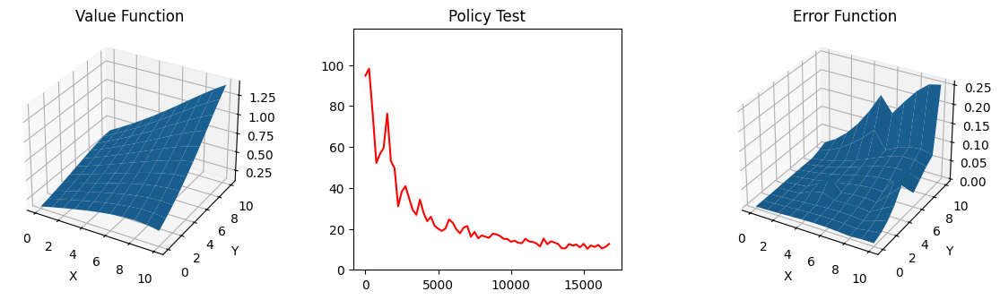

V V V V V   V V V V V 
V V V V x   V V V V V 
V V V V V > V V V V V 
V V V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > > > V V 
> > > > V   > > > > V 
> > > > ^   > > > O ^ 


Mean Square Error = 0.41374708277710803
____________________________________________________________________________________________________
Episode: 17250
Average: 11.0
Goal: (10, 9)



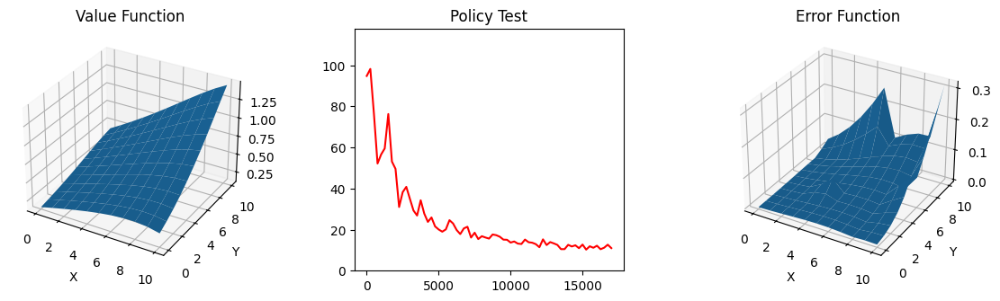

V V V V x   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
V V V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > > V V 
> > > > V   > > > > V 
> > > > > > > > > > V 
> > > > V   > > > > O 
> > > > ^   > > > > ^ 


Mean Square Error = 0.5080036060861661
____________________________________________________________________________________________________
Episode: 17500
Average: 11.066666666666666
Goal: (9, 8)



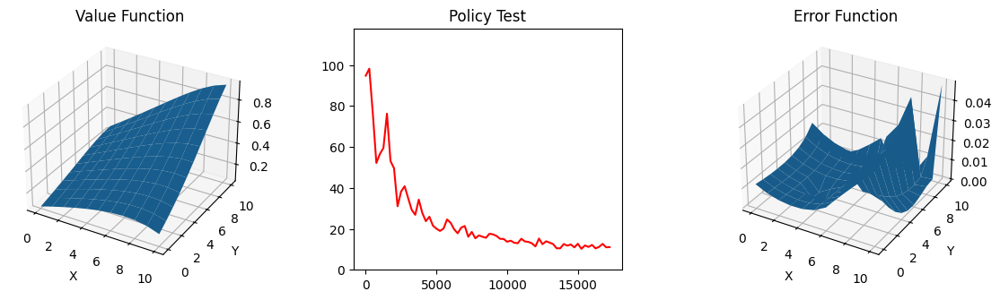

V x V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > > V V 
> > > > V   > > > > V 
> > > > > > > > > O V 
> > > > ^   > > > > V 
> > > > ^   > > > > ^ 


Mean Square Error = 0.115133956445705
____________________________________________________________________________________________________
Episode: 17750
Average: 11.066666666666666
Goal: (9, 9)



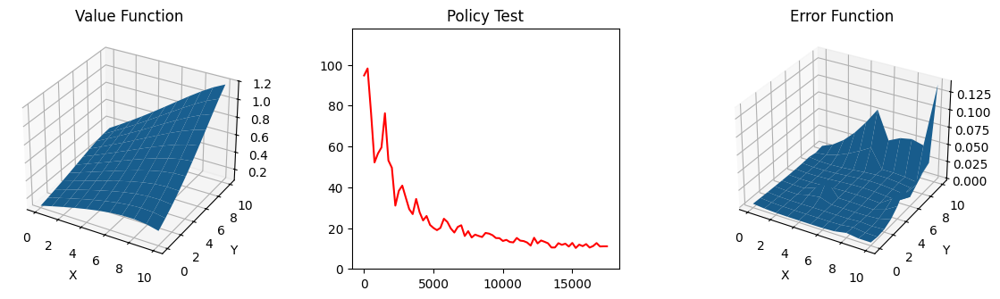

V V V x V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
V V V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > V   > > > O V 
> > > > ^   > > > > ^ 


Mean Square Error = 0.0838359900485227
____________________________________________________________________________________________________
Episode: 18000
Average: 9.833333333333334
Goal: (8, 9)



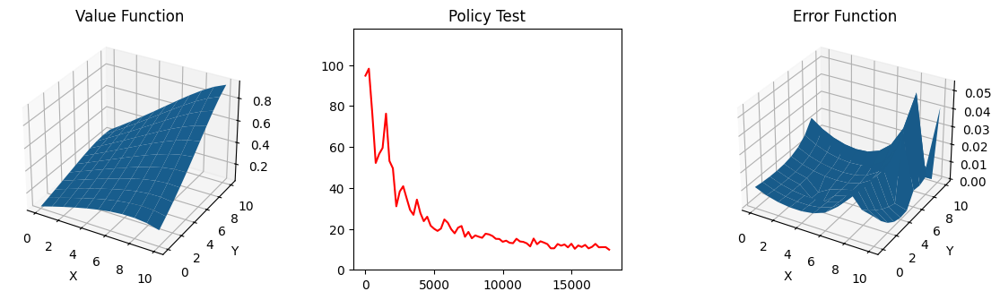

V V V V x   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > > > V V 
> > > > V   > > O > V 
> > > > ^   > > > > ^ 


Mean Square Error = 0.11340444072516327
____________________________________________________________________________________________________
Episode: 18250
Average: 11.2
Goal: (7, 6)



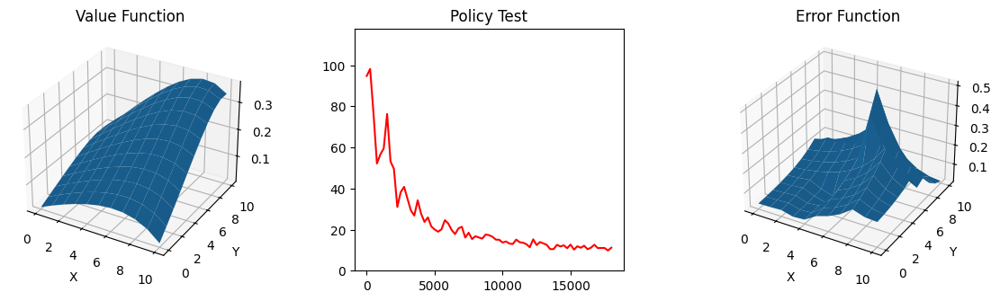

V V V V V   V V V V V 
V V V V V   V V V V V 
> > > x V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > O V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > ^   > > > > ^ 
> > > > ^   > > ^ ^ ^ 


Mean Square Error = 1.4312695793007557
____________________________________________________________________________________________________
Episode: 18500
Average: 10.233333333333333
Goal: (10, 6)



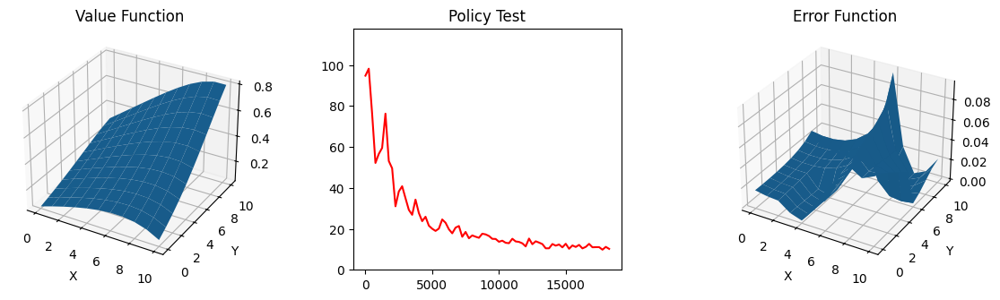

V V V V V   V V V V V 
V V x V V   V V V V V 
V V > > V > V V V V V 
> > > > V   > V V V V 
> > > > V   > > V V V 
    >           >     
> > > > V   > > > > O 
> > > > V   > > > > V 
> > > > > > > > > > V 
> > > > ^   > > > > V 
^ > > > ^   > > > > ^ 


Mean Square Error = 0.28861229950264655
____________________________________________________________________________________________________
Episode: 18750
Average: 9.7
Goal: (7, 6)



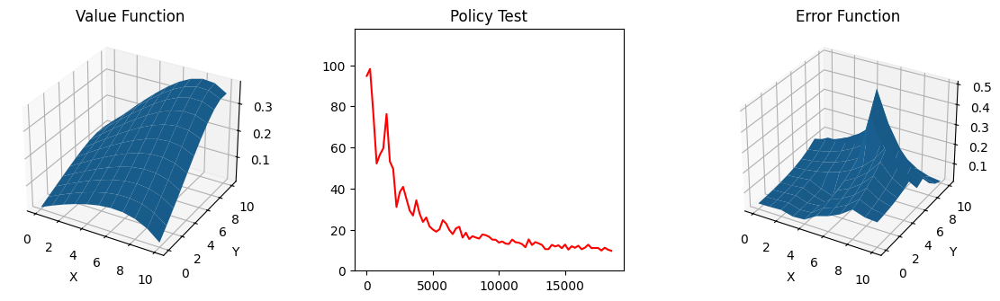

V V V V V   V V V V V 
V V V V V   V V V V V 
> > > x V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > O V V V 
> > > > V   > > > V V 
> > > > > > > > > > V 
> > > > ^   > > > > ^ 
> > > > ^   > > ^ ^ ^ 


Mean Square Error = 1.3976365346476713
____________________________________________________________________________________________________
Episode: 19000
Average: 10.566666666666666
Goal: (8, 7)



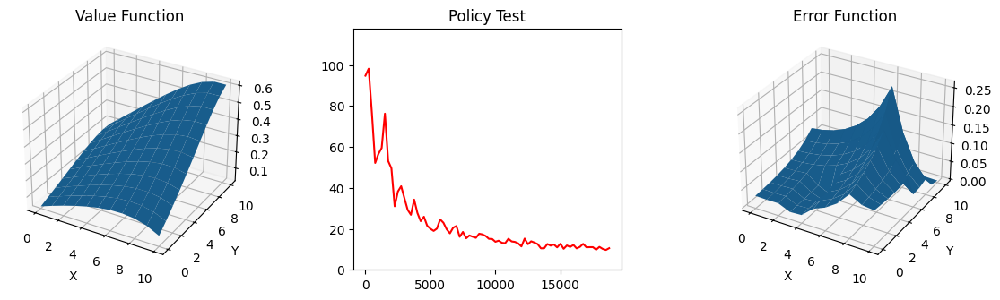

V V V V V   V V V V V 
V V x V V   V V V V V 
> V V V V > V V V V V 
> > > > V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > > V V V 
> > > > V   > > O V V 
> > > > > > > > > > V 
> > > > ^   > > > > V 
> > > > ^   > > > > ^ 


Mean Square Error = 0.8190588219051907
____________________________________________________________________________________________________
Episode: 19250
Average: 9.9
Goal: (6, 8)



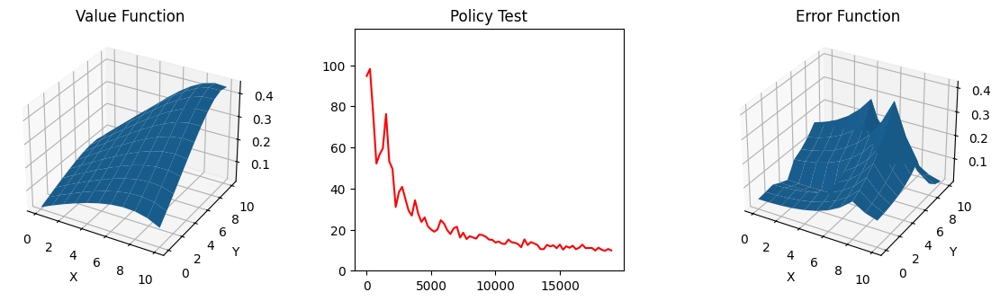

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> > x V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   > V V V V 
> > > > > > O > V V V 
> > > > ^   > > > V < 
> > > > ^   > > > ^ < 


Mean Square Error = 1.453881058716631
____________________________________________________________________________________________________
Episode: 19500
Average: 10.000000000000002
Goal: (6, 8)



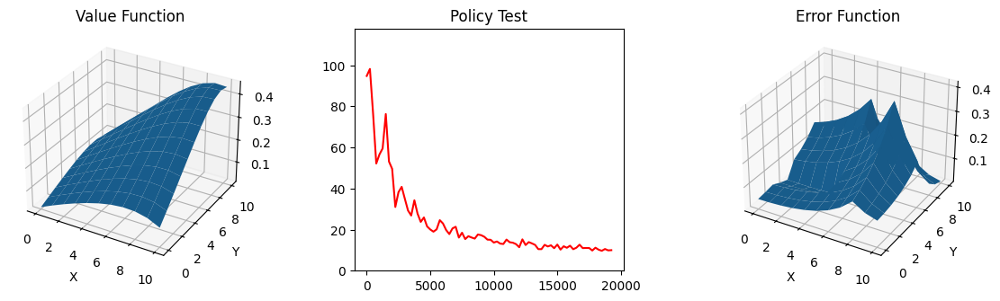

V V V V V   V V V V V 
V V V V V   V V V V V 
V V V V x > V V V V V 
> > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   V V V V V 
> > > > V   > V V V V 
> > > > > > O > V V V 
> > > > ^   > > > V < 
> > > > ^   > > > ^ < 


Mean Square Error = 1.4399368584049386
____________________________________________________________________________________________________
Episode: 19750
Average: 11.033333333333333
Goal: (7, 9)



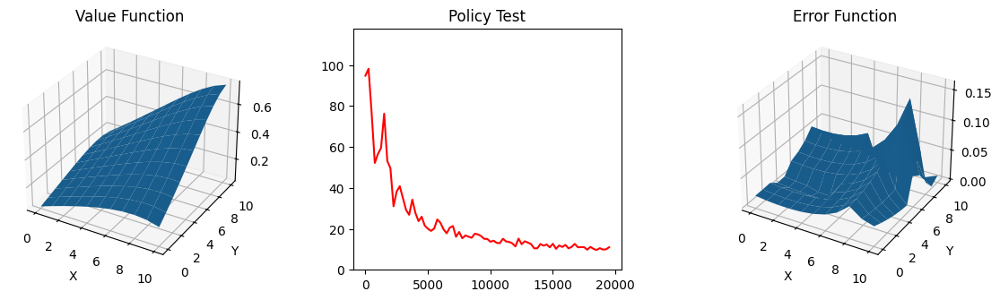

V V V x V   V V V V V 
V V V V V   V V V V V 
V V V V V > V V V V V 
> > V V V   V V V V V 
> > > > V   V V V V V 
    >           V     
> > > > V   > V V V V 
> > > > V   > > V V V 
> > > > > > > > V V V 
> > > > V   > O > V V 
> > > > ^   > > > > < 


Mean Square Error = 0.35024062782425586
____________________________________________________________________________________________________
Episode: 20000
Average: 9.7
Goal: (10, 8)



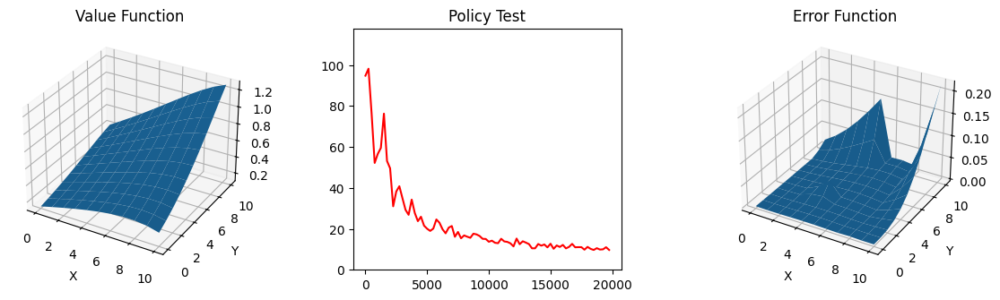

V V V V V   V V V V V 
V V V V V   V V V V V 
x V V V V > V V V V V 
V V > > V   V V V V V 
> > > > V   > V V V V 
    >           V     
> > > > V   > > > V V 
> > > > V   > > > > V 
> > > > > > > > > > O 
> > > > V   > > > > V 
> > > > ^   > > > > ^ 


Mean Square Error = 0.21395797518205473
____________________________________________________________________________________________________


In [12]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d import Axes3D
import random
import itertools
import math

ROOM_SIZE = 5  #Odd
DEGREE = 4
EPISODES = 20000
STEP_SIZE_0 = 5*(10**-2)
STEP_SIZE_1 = 1*(10**-5)
DISCOUNT = .9
SHOW_EPISODE = 250
SIZE = ROOM_SIZE*2+1
NUM_TEST = 30


def main():
    epsilon = 1
    step_size = STEP_SIZE_0
    weights = np.full((DEGREE+1,)*6, 0.0)
    store_avg = []

    for current in range(EPISODES):
        x1 = [[np.random.randint([0,ROOM_SIZE+1,0,ROOM_SIZE+1][i],[ROOM_SIZE,SIZE,ROOM_SIZE,SIZE][i]) for _ in range(ROOM_SIZE)] for i in range(4)]
        y1 = [[np.random.randint([0,0,ROOM_SIZE+1,ROOM_SIZE+1][i],[ROOM_SIZE,ROOM_SIZE,SIZE,SIZE][i]) for _ in range(ROOM_SIZE)] for i in range(4)]
        pos_combined = [(a, b) for c1, c2 in zip(x1, y1) for a, b in zip(c1, c2)]
        g1 = [[np.random.randint([ROOM_SIZE+1,ROOM_SIZE+1,ROOM_SIZE+1,ROOM_SIZE+1][i],[SIZE,SIZE,SIZE,SIZE][i]) for _ in range(ROOM_SIZE)] for i in range(4)]
        g2 = [[np.random.randint([ROOM_SIZE+1,ROOM_SIZE+1,ROOM_SIZE+1,ROOM_SIZE+1][i],[SIZE,SIZE,SIZE,SIZE][i]) for _ in range(ROOM_SIZE)] for i in range(4)]
        goal_combined = [(a, b) for c1, c2 in zip(g1, g2) for a, b in zip(c1, c2)]

        pos_goal = list(zip(pos_combined,goal_combined))
        for pos,goal in pos_goal:
            dist = np.subtract(goal,pos)

            a = pick_action(pos,goal,epsilon,weights)
            action = (round(math.cos(a)),round(math.sin(a)))
            new_pos = find_new(action,pos)
            new_dist = np.subtract(goal,new_pos)

            features = calc_features(pos,goal,dist)
            next_features = calc_features(new_pos,goal,new_dist)
            reward = find_reward(pos,new_pos,goal)

            old_value = np.sum(np.multiply(weights,features))
            new_value = np.sum(np.multiply(weights,next_features))

            td_error = step_size*(reward+DISCOUNT*new_value-old_value)*features
            weights = np.add(weights,td_error)

        if((current+1)%SHOW_EPISODE==0):
            pos_0 = (0,0)
            dist = (0,0)
            count,average = 0,0

            for i in range(NUM_TEST):
                pos = (np.random.randint(0,ROOM_SIZE),np.random.randint(0,ROOM_SIZE))
                goal = (np.random.randint(ROOM_SIZE+1,SIZE),np.random.randint(ROOM_SIZE+1,SIZE))
                pos_0 = pos
                dist = np.subtract(goal,pos)
                while((dist[0]!=0)and(dist[1]!=0)):
                    a = pick_action(pos,goal,epsilon,weights)
                    action = (round(math.cos(a)),round(math.sin(a)))
                    new_pos = find_new(action,pos)
                    new_dist = np.subtract(goal,new_pos)
                    pos = new_pos
                    dist = new_dist
                    count += 1
                average = (average*i+count)/((i+1))
                count = 0
            store_avg.append(average)
            show_current(weights,goal,current,average,store_avg,pos_0)
            average = 0

        epsilon = epsilon - epsilon/(EPISODES//2-1)
        step_size = STEP_SIZE_0/(1+((STEP_SIZE_0-STEP_SIZE_1)/(STEP_SIZE_1*EPISODES))*current)


def show_current(weights,goal,current,average,store_avg,pos_0):
    print('Episode: '+str(current+1)+'\nAverage: '+str(average)+'\nGoal: '+str(goal),end='\n\n')
    x,y = np.meshgrid(np.arange(SIZE),np.arange(SIZE))
    z1 = np.array([[find_value((i, j), goal, np.subtract(goal, (i, j)), weights) for j in range(SIZE)] for i in range(SIZE)])
    fig = plt.figure(figsize=(18,3.5))
    gs = GridSpec(1, 3, width_ratios=[2,1,2])
    ax1 = fig.add_subplot(gs[0], projection="3d")
    ax1.plot_surface(x,y,z1)
    ax1.set(title='Value Function',xlabel='X',ylabel='Y')
    ax1.view_init(elev=30, azim=-60)
    ax2 = fig.add_subplot(gs[1])
    ax2.plot(SHOW_EPISODE*np.arange(len(store_avg)),np.array(store_avg),color='red')
    ax2.set(title='Policy Test',ylim=[0,1.2*max(store_avg)])
    #plt.xlim([0,EPISODES//SHOW_EPISODE])
    ax3 = fig.add_subplot(gs[2],projection='3d')
    z2 = np.array([[(find_value((i,j),goal,np.subtract(goal,(i,j)),weights)-optimal_value((i, j), goal))**2 for j in range(SIZE)] for i in range(SIZE)])
    #z2 = np.array([[optimal_value((i, j), goal) for j in range(SIZE)] for i in range(SIZE)])
    ax3.set(title='Error Function',xlabel='X',ylabel='Y')
    ax3.view_init(elev=30, azim=-60)
    ax3.plot_surface(x,y,z2)

    plt.subplots_adjust(wspace=-.1)
    plt.show()
    print_policy(weights,goal,pos_0)
    print('Mean Square Error = ' + str(np.sum(z2)/len(z2)) + '\n'+'_'*100)

def calc_features(pos,goal,dist):
    indices = np.indices((DEGREE+1,)*6)
    start_x, start_y, end_x, end_y, x_dist, y_dist = [indices[i].flatten() for i in range(6)]
    temp = (
        ((pos[0]/SIZE)**start_x)*((pos[1]/SIZE)**start_y)*
        ((goal[0]/SIZE)**end_x)*((goal[1]/SIZE)**end_y)*
        ((dist[0]/SIZE)**x_dist)*((dist[1]/SIZE)**y_dist)
    )
    temp = temp.reshape((DEGREE+1,)*6)
    return(temp)

def pick_action(pos,goal,epsilon,weights):
    if(np.random.random()<epsilon):
        return(np.random.choice([0,np.pi/2,np.pi,3*np.pi/2]))
    else:
        return((np.pi/2)*arg_max(pos,goal,weights))

def arg_max(pos,goal,weights):
    values = np.zeros(4)
    for i in range(4):
        new_pos = find_new((round(math.cos(np.pi/2*i)),round(math.sin(np.pi/2*i))),pos)
        if(new_pos[0]!=pos[0]or new_pos[1]!=pos[1]):
            values[i] = find_value(new_pos,goal,np.subtract(goal,new_pos),weights)
        else:
            values[i] = -math.inf
    return(np.argmax(values))

def find_value(pos,goal,dist,weights):
    flat_w = weights.flatten()
    indices = np.indices((DEGREE+1,)*6)
    start_x, start_y, end_x, end_y, x_dist, y_dist = [indices[i].flatten() for i in range(6)]
    values = flat_w*(
        ((pos[0]/SIZE)**start_x)*((pos[1]/SIZE)**start_y)*
        ((goal[0]/SIZE)**end_x)*((goal[1]/SIZE)**end_y)*
        ((dist[0]/SIZE)**x_dist)*((dist[1]/SIZE)**y_dist)
    )
    return values.sum()

def min_dist(pos,goal,index=-1):
    if(index==-1):
        return min(np.sum([abs(np.subtract(pos,goal)[i]) for i in [0,1]]),np.sum([abs(np.subtract(pos,(goal[1],goal[0]))[i]) for i in [0,1]]))
    return [np.sum([abs(np.subtract(pos,((ROOM_SIZE-1)/2,ROOM_SIZE-1))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-ROOM_SIZE,SIZE-1-(ROOM_SIZE-1)/2))[i]) for i in [0,1]]), \
            np.sum([abs(np.subtract(pos,(ROOM_SIZE-1,(ROOM_SIZE-1)/2))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))[i]) for i in [0,1]])][index]

def optimal_value(pos,goal,first=True):
    if(pos==goal):
        return find_reward(pos,pos,goal)
    if(not first):
        return find_reward((-1,-1),pos,goal) + DISCOUNT*optimal_value((pos[0]-1,pos[1]),goal,first=False)
    d = 0
    if(pos[0]<ROOM_SIZE and pos[1]<ROOM_SIZE):
        i = np.argmin([np.sum([abs(np.subtract(pos,((ROOM_SIZE-1)/2,ROOM_SIZE-1))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-ROOM_SIZE,SIZE-1-(ROOM_SIZE-1)/2))[i]) for i in [0,1]]), \
            np.sum([abs(np.subtract(pos,(ROOM_SIZE-1,(ROOM_SIZE-1)/2))[i]) for i in [0,1]]) + np.sum([abs(np.subtract(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))[i]) for i in [0,1]])])
        d = min_dist(pos,goal,index=i) + ROOM_SIZE+3
    elif(pos[0]>ROOM_SIZE and pos[1]>ROOM_SIZE):
        d = np.sum([abs(np.subtract(pos,goal)[i]) for i in [0,1]])
    else:
        d = min_dist(pos,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE)) + min_dist(goal,(SIZE-1-(ROOM_SIZE-1)/2,SIZE-ROOM_SIZE))
    return (find_reward((d-1,0),(d,0),(0,0)) + DISCOUNT*optimal_value((d-1,0),(0,0),first=False))

def find_new(action,pos):
    new_pos = [min(SIZE-1,max(0,action[i]+pos[i])) for i in range(2)]
    for i in range(2):
        if(new_pos[0]==ROOM_SIZE and (new_pos[1-i]!=ROOM_SIZE//2 and new_pos[1-i]!=2*ROOM_SIZE-ROOM_SIZE//2)):
            new_pos[i] = pos[i]
    return tuple(new_pos)

def find_reward(pos,new_pos,goal):
    if(new_pos==goal):
        return 1
    elif(pos==new_pos):
        return(-1/ROOM_SIZE)
    else:
        return 0
        return(-np.sum([abs(np.subtract(new_pos,goal)[i]) for i in [0,1]])/ROOM_SIZE)

def print_policy(weights,goal,pos):
    sym = {0: ">", 1: "V", 2: "<", 3: "^"}
    for y in range(SIZE):
        for x in range(SIZE):
            if((x,y)==goal):
                print('O',end=' ')
            elif((x,y)==pos):
                print('x',end=' ')
            elif((x==ROOM_SIZE and (y not in {ROOM_SIZE//2,2*ROOM_SIZE-ROOM_SIZE//2}))or \
                 (y==ROOM_SIZE and (x not in {ROOM_SIZE//2,2*ROOM_SIZE-ROOM_SIZE//2}))):
                print(' ',end=' ')
            else:
                print(sym[arg_max((x,y),goal,weights)],end=' ')
        print()
    print('\n')

main()